In [ ]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()
#
#{"username":"abhishekkaneriya","key":"8310986fd716ec247c7a2f597e8737b8"}

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

ga_customer_revenue_prediction_path = kagglehub.competition_download('ga-customer-revenue-prediction')

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ga-customer-revenue-prediction/sample_submission.csv
/kaggle/input/ga-customer-revenue-prediction/train_v2.csv
/kaggle/input/ga-customer-revenue-prediction/test_v2.csv
/kaggle/input/ga-customer-revenue-prediction/sample_submission_v2.csv
/kaggle/input/ga-customer-revenue-prediction/train.csv
/kaggle/input/ga-customer-revenue-prediction/test.csv


In [ ]:
import os
import json
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import scipy.stats as st
import plotly.express as px
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

from tqdm import tqdm
from plotly import tools
from pandas import json_normalize
from plotly.offline import init_notebook_mode, iplot
import xgboost as xgb
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings('ignore')

# Create a list of colors
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = 10, 6
pd.options.display.float_format = '{:,.0f}'.format
np.set_printoptions(formatter={'float': '{: 0.0f}'.format})

In [ ]:

# Extract features from 'device', 'geoNetwork', 'totals', 'trafficSource’.
json_columns = ['device', 'geoNetwork','totals', 'trafficSource']

def load_dataframe(csv_path):
    path = csv_path
    df = pd.read_csv(path, converters={column: json.loads for column in json_columns},
                     dtype={'fullVisitorId': 'str'})

    for column in json_columns:
        column_as_df = json_normalize(df[column])
        column_as_df.columns = [f"{column}_{subcolumn}" for subcolumn in column_as_df.columns]
        df = df.drop(column, axis=1).merge(column_as_df, right_index=True, left_index=True)

    return df



In [ ]:
train = load_dataframe('/kaggle/input/ga-customer-revenue-prediction/train.csv')
test = load_dataframe('/kaggle/input/ga-customer-revenue-prediction/test.csv')

In [ ]:
# Store the dataframes as csv files
train.to_csv('train_df.csv')
test.to_csv('test_df.csv')

In [ ]:
# Read csv files
train = pd.read_csv('train_df.csv', dtype={'fullVisitorId': 'str'}, index_col=0)

test = pd.read_csv('test_df.csv', dtype={'fullVisitorId': 'str'}, index_col=0)

print(train.shape)
print(test.shape)

(903653, 55)
(804684, 53)


In [ ]:
train.head()

,channelGrouping,date,fullVisitorId,sessionId,socialEngagementType,visitId,visitNumber,visitStartTime,device_browser,device_browserVersion,...,trafficSource_adwordsClickInfo.criteriaParameters,trafficSource_isTrueDirect,trafficSource_referralPath,trafficSource_adwordsClickInfo.page,trafficSource_adwordsClickInfo.slot,trafficSource_adwordsClickInfo.gclId,trafficSource_adwordsClickInfo.adNetworkType,trafficSource_adwordsClickInfo.isVideoAd,trafficSource_adContent,trafficSource_campaignCode
0,Organic Search,20160902,1131660440785968503,1131660440785968503_1472830385,Not Socially Engaged,1472830385,1,1472830385,Chrome,not available in demo dataset,...,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Organic Search,20160902,377306020877927890,377306020877927890_1472880147,Not Socially Engaged,1472880147,1,1472880147,Firefox,not available in demo dataset,...,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Organic Search,20160902,3895546263509774583,3895546263509774583_1472865386,Not Socially Engaged,1472865386,1,1472865386,Chrome,not available in demo dataset,...,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Organic Search,20160902,4763447161404445595,4763447161404445595_1472881213,Not Socially Engaged,1472881213,1,1472881213,UC Browser,not available in demo dataset,...,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Organic Search,20160902,27294437909732085,27294437909732085_1472822600,Not Socially Engaged,1472822600,2,1472822600,Chrome,not available in demo dataset,...,not available in demo dataset,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 903653 entries, 0 to 903652
Data columns (total 55 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   channelGrouping                                    903653 non-null  object 
 1   date                                               903653 non-null  int64  
 2   fullVisitorId                                      903653 non-null  object 
 3   sessionId                                          903653 non-null  object 
 4   socialEngagementType                               903653 non-null  object 
 5   visitId                                            903653 non-null  int64  
 6   visitNumber                                        903653 non-null  int64  
 7   visitStartTime                                     903653 non-null  int64  
 8   device_browser                                     903653 non-null  object 
 9 

In [ ]:
test.head()

,channelGrouping,date,fullVisitorId,sessionId,socialEngagementType,visitId,visitNumber,visitStartTime,device_browser,device_browserVersion,...,trafficSource_keyword,trafficSource_isTrueDirect,trafficSource_adwordsClickInfo.criteriaParameters,trafficSource_adwordsClickInfo.page,trafficSource_adwordsClickInfo.slot,trafficSource_adwordsClickInfo.gclId,trafficSource_adwordsClickInfo.adNetworkType,trafficSource_adwordsClickInfo.isVideoAd,trafficSource_referralPath,trafficSource_adContent
0,Organic Search,20171016,6167871330617112363,6167871330617112363_1508151024,Not Socially Engaged,1508151024,2,1508151024,Chrome,not available in demo dataset,...,(not provided),True,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Organic Search,20171016,0643697640977915618,0643697640977915618_1508175522,Not Socially Engaged,1508175522,1,1508175522,Chrome,not available in demo dataset,...,(not provided),NaN,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Organic Search,20171016,6059383810968229466,6059383810968229466_1508143220,Not Socially Engaged,1508143220,1,1508143220,Chrome,not available in demo dataset,...,(not provided),NaN,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Organic Search,20171016,2376720078563423631,2376720078563423631_1508193530,Not Socially Engaged,1508193530,1,1508193530,Safari,not available in demo dataset,...,(not provided),NaN,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Organic Search,20171016,2314544520795440038,2314544520795440038_1508217442,Not Socially Engaged,1508217442,1,1508217442,Safari,not available in demo dataset,...,(not provided),NaN,not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 804684 entries, 0 to 804683
Data columns (total 53 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   channelGrouping                                    804684 non-null  object 
 1   date                                               804684 non-null  int64  
 2   fullVisitorId                                      804684 non-null  object 
 3   sessionId                                          804684 non-null  object 
 4   socialEngagementType                               804684 non-null  object 
 5   visitId                                            804684 non-null  int64  
 6   visitNumber                                        804684 non-null  int64  
 7   visitStartTime                                     804684 non-null  int64  
 8   device_browser                                     804684 non-null  object 
 9 

## 2. Data Preprocessing

 2.1 Remove Constant Features

Features that have only one unique value are often referred to as constant features or constant columns.   

These features do not provide any variability in the data, and as a result, they typically do not contribute    
useful information to the model. We might as well drop these features.

In [ ]:
train.columns

Index(['channelGrouping', 'date', 'fullVisitorId', 'sessionId',
       'socialEngagementType', 'visitId', 'visitNumber', 'visitStartTime',
       'device_browser', 'device_browserVersion', 'device_browserSize',
       'device_operatingSystem', 'device_operatingSystemVersion',
       'device_isMobile', 'device_mobileDeviceBranding',
       'device_mobileDeviceModel', 'device_mobileInputSelector',
       'device_mobileDeviceInfo', 'device_mobileDeviceMarketingName',
       'device_flashVersion', 'device_language', 'device_screenColors',
       'device_screenResolution', 'device_deviceCategory',
       'geoNetwork_continent', 'geoNetwork_subContinent', 'geoNetwork_country',
       'geoNetwork_region', 'geoNetwork_metro', 'geoNetwork_city',
       'geoNetwork_cityId', 'geoNetwork_networkDomain', 'geoNetwork_latitude',
       'geoNetwork_longitude', 'geoNetwork_networkLocation', 'totals_visits',
       'totals_hits', 'totals_pageviews', 'totals_bounces', 'totals_newVisits',
       'totals_t

In [ ]:
# Keep 'totals_bounces' column
train['totals_bounces'].unique()

array([ 1,  nan])

In [ ]:
train['totals_bounces'].fillna(0, inplace=True)
train['totals_bounces'].value_counts()

totals_bounces
0    453023
1    450630
Name: count, dtype: int64

In [ ]:
# check unique values in train columns
train.nunique()

channelGrouping                                           8
date                                                    366
fullVisitorId                                        714167
sessionId                                            902755
socialEngagementType                                      1
visitId                                              886303
visitNumber                                             384
visitStartTime                                       887159
device_browser                                           54
device_browserVersion                                     1
device_browserSize                                        1
device_operatingSystem                                   20
device_operatingSystemVersion                             1
device_isMobile                                           2
device_mobileDeviceBranding                               1
device_mobileDeviceModel                                  1
device_mobileInputSelector              

In [ ]:
# Identify constant features
constant_features = train.columns[train.nunique() == 1]

# Remove constant features
train.drop(columns=constant_features, inplace=True)
train.shape

(903653, 32)

In [ ]:
# Keep 'totals_bounces' column
test['totals_bounces'].unique()

array([ nan,  1])

In [ ]:
test['totals_bounces'].fillna(0, inplace=True)
test['totals_bounces'].value_counts()

totals_bounces
1    420948
0    383736
Name: count, dtype: int64

In [ ]:
# check unique values in test columns
test.nunique()

channelGrouping                                           8
date                                                    272
fullVisitorId                                        617242
sessionId                                            803863
socialEngagementType                                      1
visitId                                              779504
visitNumber                                             446
visitStartTime                                       780264
device_browser                                          109
device_browserVersion                                     1
device_browserSize                                        1
device_operatingSystem                                   22
device_operatingSystemVersion                             1
device_isMobile                                           2
device_mobileDeviceBranding                               1
device_mobileDeviceModel                                  1
device_mobileInputSelector              

In [ ]:
# Identify constant features
constant_features = test.columns[test.nunique() == 1]

# Remove constant features
test.drop(columns=constant_features, inplace=True)
test.shape

(804684, 31)

### 2.2 Find Percentage of missing values in the columns

- credits:   
https://stackoverflow.com/questions/51070985/find-out-the-percentage-of-missing-values-in-each-column-in-the-given-dataset

In [ ]:
# train_df - Check the percentage of missing values in each column
percent_missing_train = train.isnull().sum() * 100 / len(train)

missing_value_train = pd.DataFrame({'percent_missing': percent_missing_train})
missing_value_train.sort_values(by='percent_missing', ascending=False, inplace=True)

# Columns with percent_missing > 0
missing_value_train_filtered = missing_value_train.loc[missing_value_train['percent_missing'] > 0]
missing_value_train_filtered

,percent_missing
trafficSource_adContent,99
totals_transactionRevenue,99
trafficSource_adwordsClickInfo.adNetworkType,98
trafficSource_adwordsClickInfo.slot,98
trafficSource_adwordsClickInfo.page,98
trafficSource_adwordsClickInfo.gclId,98
trafficSource_referralPath,63
trafficSource_keyword,56
totals_pageviews,0


In [ ]:
# test_df - Check the percentage of missing values in each column
percent_missing_test = test.isnull().sum() * 100 / len(test)

missing_value_test = pd.DataFrame({#'column_name': test_df.columns,
                                 'percent_missing': percent_missing_test})
missing_value_test.sort_values(by='percent_missing', ascending=False, inplace=True)

# Columns with percent_missing > 0
missing_value_test_filtered = missing_value_test.loc[missing_value_test['percent_missing'] > 0]
missing_value_test_filtered

,percent_missing
trafficSource_adContent,93
trafficSource_adwordsClickInfo.adNetworkType,93
trafficSource_adwordsClickInfo.slot,93
trafficSource_adwordsClickInfo.page,93
trafficSource_adwordsClickInfo.gclId,93
trafficSource_referralPath,71
trafficSource_keyword,49
totals_pageviews,0


### 2.3 Columns to Drop

In [ ]:
train.columns

Index(['channelGrouping', 'date', 'fullVisitorId', 'sessionId', 'visitId',
       'visitNumber', 'visitStartTime', 'device_browser',
       'device_operatingSystem', 'device_isMobile', 'device_deviceCategory',
       'geoNetwork_continent', 'geoNetwork_subContinent', 'geoNetwork_country',
       'geoNetwork_region', 'geoNetwork_metro', 'geoNetwork_city',
       'geoNetwork_networkDomain', 'totals_hits', 'totals_pageviews',
       'totals_bounces', 'totals_transactionRevenue', 'trafficSource_campaign',
       'trafficSource_source', 'trafficSource_medium', 'trafficSource_keyword',
       'trafficSource_referralPath', 'trafficSource_adwordsClickInfo.page',
       'trafficSource_adwordsClickInfo.slot',
       'trafficSource_adwordsClickInfo.gclId',
       'trafficSource_adwordsClickInfo.adNetworkType',
       'trafficSource_adContent'],
      dtype='object')

In [ ]:
cols_to_drop = ['geoNetwork_continent', 'geoNetwork_subContinent',
                'geoNetwork_metro', 'geoNetwork_city', 'geoNetwork_networkDomain',
                'trafficSource_campaign', 'trafficSource_keyword',
                'trafficSource_referralPath', 'trafficSource_adwordsClickInfo.page',
                'trafficSource_adwordsClickInfo.slot', 'trafficSource_adwordsClickInfo.gclId',
                'trafficSource_adContent', 'visitId', 'visitStartTime']

In [ ]:
df_train = train.copy()

df_train = df_train.drop(columns=cols_to_drop, axis=1)
df_train

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,geoNetwork_region,totals_hits,totals_pageviews,totals_bounces,totals_transactionRevenue,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType
0,Organic Search,20160902,1131660440785968503,1131660440785968503_1472830385,1,Chrome,Windows,False,desktop,Turkey,Izmir,1,1,1,NaN,google,organic,NaN
1,Organic Search,20160902,377306020877927890,377306020877927890_1472880147,1,Firefox,Macintosh,False,desktop,Australia,not available in demo dataset,1,1,1,NaN,google,organic,NaN
2,Organic Search,20160902,3895546263509774583,3895546263509774583_1472865386,1,Chrome,Windows,False,desktop,Spain,Community of Madrid,1,1,1,NaN,google,organic,NaN
3,Organic Search,20160902,4763447161404445595,4763447161404445595_1472881213,1,UC Browser,Linux,False,desktop,Indonesia,not available in demo dataset,1,1,1,NaN,google,organic,NaN
4,Organic Search,20160902,27294437909732085,27294437909732085_1472822600,2,Chrome,Android,True,mobile,United Kingdom,not available in demo dataset,1,1,1,NaN,google,organic,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
903648,Social,20170104,5123779100307500332,5123779100307500332_1483554750,1,Chrome,Windows,False,desktop,Puerto Rico,not available in demo dataset,17,15,0,NaN,youtube.com,referral,NaN
903649,Social,20170104,7231728964973959842,7231728964973959842_1483543798,1,Chrome,Android,True,mobile,Sri Lanka,not available in demo dataset,18,13,0,NaN,youtube.com,referral,NaN
903650,Social,20170104,5744576632396406899,5744576632396406899_1483526434,1,Android Webview,Android,True,mobile,South Korea,Seoul,24,21,0,NaN,youtube.com,referral,NaN
903651,Social,20170104,2709355455991750775,2709355455991750775_1483592857,1,Chrome,Windows,False,desktop,Indonesia,not available in demo dataset,24,22,0,NaN,facebook.com,referral,NaN


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 903653 entries, 0 to 903652
Data columns (total 18 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   channelGrouping                               903653 non-null  object 
 1   date                                          903653 non-null  int64  
 2   fullVisitorId                                 903653 non-null  object 
 3   sessionId                                     903653 non-null  object 
 4   visitNumber                                   903653 non-null  int64  
 5   device_browser                                903653 non-null  object 
 6   device_operatingSystem                        903653 non-null  object 
 7   device_isMobile                               903653 non-null  bool   
 8   device_deviceCategory                         903653 non-null  object 
 9   geoNetwork_country                            903653 

In [ ]:
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
date,"903,653","20,165,885","4,698","20,160,801","20,161,027","20,170,109","20,170,421","20,170,801"
visitNumber,"903,653",2,9,1,1,1,1,395
totals_hits,"903,653",5,10,1,1,2,4,500
totals_pageviews,"903,553",4,7,1,1,1,4,469
totals_bounces,"903,653",0,0,0,0,0,1,1
totals_transactionRevenue,"11,515","133,744,789","448,285,227","10,000","24,930,000","49,450,000","107,655,000","23,129,500,000"


In [ ]:
df_test = test.copy()

df_test = df_test.drop(columns=cols_to_drop, axis=1)
df_test

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,geoNetwork_region,totals_hits,totals_pageviews,totals_bounces,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType
0,Organic Search,20171016,6167871330617112363,6167871330617112363_1508151024,2,Chrome,Macintosh,False,desktop,Singapore,(not set),4,4,0,google,organic,NaN
1,Organic Search,20171016,0643697640977915618,0643697640977915618_1508175522,1,Chrome,Windows,False,desktop,Spain,Aragon,5,5,0,google,organic,NaN
2,Organic Search,20171016,6059383810968229466,6059383810968229466_1508143220,1,Chrome,Macintosh,False,desktop,France,not available in demo dataset,7,7,0,google,organic,NaN
3,Organic Search,20171016,2376720078563423631,2376720078563423631_1508193530,1,Safari,iOS,True,mobile,United States,California,8,4,0,google,organic,NaN
4,Organic Search,20171016,2314544520795440038,2314544520795440038_1508217442,1,Safari,Macintosh,False,desktop,United States,California,9,4,0,google,organic,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804679,Social,20180421,9084225574121020383,9084225574121020383_1524358436,2,Edge,Windows,False,desktop,United States,Illinois,33,26,0,youtube.com,referral,NaN
804680,Social,20180421,6146210385566305056,6146210385566305056_1524317728,1,Chrome,Android,True,mobile,Uruguay,not available in demo dataset,36,34,0,youtube.com,referral,NaN
804681,Social,20180421,7484543584006767361,7484543584006767361_1524364725,1,Safari (in-app),iOS,True,mobile,Canada,not available in demo dataset,53,35,0,m.facebook.com,referral,NaN
804682,Social,20180421,2915966035609674201,2915966035609674201_1524330416,1,Samsung Internet,Android,True,mobile,Ireland,County Dublin,58,34,0,youtube.com,referral,NaN


In [ ]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 804684 entries, 0 to 804683
Data columns (total 17 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   channelGrouping                               804684 non-null  object 
 1   date                                          804684 non-null  int64  
 2   fullVisitorId                                 804684 non-null  object 
 3   sessionId                                     804684 non-null  object 
 4   visitNumber                                   804684 non-null  int64  
 5   device_browser                                804684 non-null  object 
 6   device_operatingSystem                        804684 non-null  object 
 7   device_isMobile                               804684 non-null  bool   
 8   device_deviceCategory                         804684 non-null  object 
 9   geoNetwork_country                            804684 

In [ ]:
df_test.describe().T

,count,mean,std,min,25%,50%,75%,max
date,"804,684","20,174,964","4,573","20,170,802","20,171,009","20,171,212","20,180,221","20,180,430"
visitNumber,"804,684",2,9,1,1,1,1,457
totals_hits,"804,684",4,8,1,1,1,4,500
totals_pageviews,"804,545",4,6,1,1,1,4,500
totals_bounces,"804,684",1,0,0,0,1,1,1


### 2.4 Impute Missing Values

In [ ]:
# numerical columns fillna
df_train['totals_pageviews'].fillna(0, inplace=True)
df_train['totals_transactionRevenue'].fillna(0, inplace=True)

df_test['totals_pageviews'].fillna(0, inplace=True)

In [ ]:
df_train.columns

Index(['channelGrouping', 'date', 'fullVisitorId', 'sessionId', 'visitNumber',
       'device_browser', 'device_operatingSystem', 'device_isMobile',
       'device_deviceCategory', 'geoNetwork_country', 'geoNetwork_region',
       'totals_hits', 'totals_pageviews', 'totals_bounces',
       'totals_transactionRevenue', 'trafficSource_source',
       'trafficSource_medium', 'trafficSource_adwordsClickInfo.adNetworkType'],
      dtype='object')

In [ ]:
# Replace 'nan', 'NaN', '(not set)' in both dataframes
columns_to_process = ['device_browser', 'device_operatingSystem', 'trafficSource_source',
                      'trafficSource_medium', 'trafficSource_adwordsClickInfo.adNetworkType']

values_to_replace = ['nan', 'NaN', '(not set)', np.nan]
replacement_value = 'others'

for column in columns_to_process:
    df_train[column].replace(values_to_replace, replacement_value, inplace=True)

for column in columns_to_process:
    df_test[column].replace(values_to_replace, replacement_value, inplace=True)

In [ ]:
df_train['trafficSource_adwordsClickInfo.adNetworkType'].unique()


array(['others', 'Google Search', 'Search partners'], dtype=object)

In [ ]:
# Find the mismatched columns and the target variable
train_columns = set(df_train.columns)
test_columns = set(df_test.columns)
mismatched_columns = train_columns.symmetric_difference(test_columns)

print("Columns that don't match:")
print(mismatched_columns)

Columns that don't match:
{'totals_transactionRevenue'}


## 3. 'channelGrouping' & 'device' columns

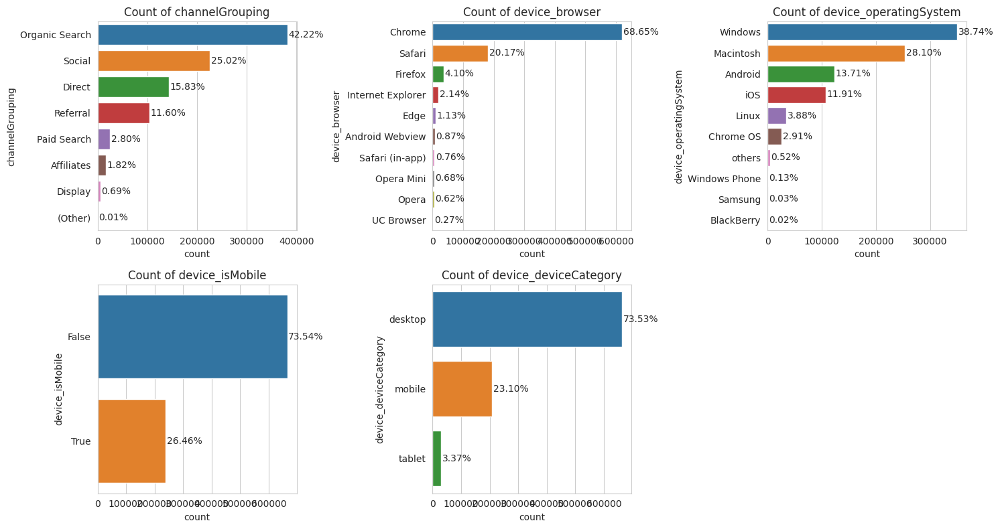

In [ ]:
device_columns = ['channelGrouping', 'device_browser', 'device_operatingSystem',
                  'device_isMobile', 'device_deviceCategory']

fig, ax = plt.subplots(figsize=(15, 8))

for i, col in enumerate(device_columns, 1):
    plt.subplot(2, 3, i)

    ax = sns.countplot(y=df_train[col], order=df_train[col].value_counts()[:10].index, )
    plt.title(f'Count of {col}')

    total = len(df_train[col])

    for c in ax.containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        ax.bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.tight_layout()
plt.show()

# Explicitly close the figure to remove overlapping axes
plt.close(fig)

### 3.1 Channels

In [ ]:
# Define the aggregation functions for each column
aggregations = {'fullVisitorId': 'count',
                'totals_pageviews': 'sum',
                'totals_transactionRevenue': 'sum'
}

In [ ]:
df_channels = df_train.groupby('channelGrouping').agg(aggregations
                                ).sort_values(by='totals_transactionRevenue', ascending=False)

df_channels

,fullVisitorId,totals_pageviews,totals_transactionRevenue
channelGrouping,,,
Referral,104838,"707,597","651,429,910,000"
Direct,143026,"584,840","434,840,550,000"
Organic Search,381561,"1,569,218","326,380,510,000"
Display,6262,"34,202","78,337,460,000"
Paid Search,25326,"136,060","43,558,900,000"
Social,226117,"398,690","4,916,540,000"
Affiliates,16403,"47,417","597,380,000"
(Other),120,442,"9,990,000"


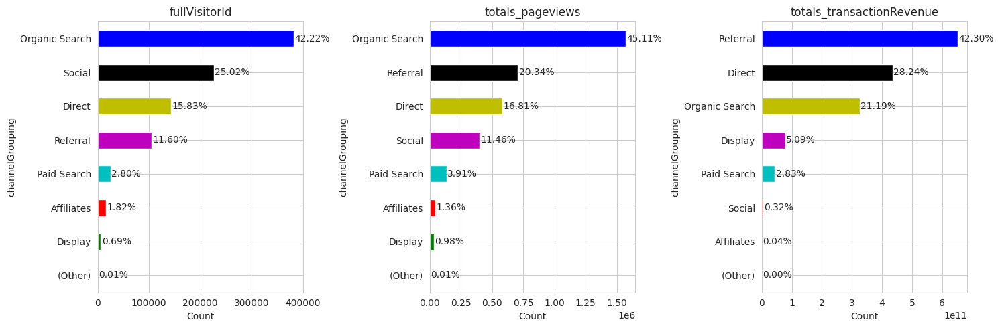

In [ ]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot each column in a separate subplot
for i, col in enumerate(df_channels.columns):
    df_channels[col].sort_values().plot(kind='barh', ax=axes[i],
                                        color=colors)
    axes[i].set_title(col)
    axes[i].set_xlabel('Count')

    total = df_channels[col].sum()

    for c in axes[i].containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        axes[i].bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.tight_layout()
plt.show()

>**Observations:**

- Organic Search brings about the highest number of users & pageviews, but
- Referral brings in close to half of the revenues.
- Direct ranks the 3rd both in number of users & pageviews, yet second only to   
    Referral in terms of generating revenues as users know pretty much what they want.
- Social Media is not as effective in generating revenues as in generating the traffics.
- Paid Search has got what the advertisers have paid for: equal amount of traffics, pageviews   
    & revenues
- Affiliates are not that much effective compared with other channels above,

### 3.2 'device_browser'

In [ ]:
df_browser = df_train.groupby('device_browser').agg(aggregations
                ).sort_values(by='totals_transactionRevenue', ascending=False).head(10)

df_browser

,fullVisitorId,totals_pageviews,totals_transactionRevenue
device_browser,,,
Chrome,620364,"2,653,448","1,383,104,960,000"
Firefox,37069,"114,184","89,316,320,000"
Safari,182245,"544,508","52,397,480,000"
Internet Explorer,19375,"53,988","8,255,550,000"
Edge,10205,"32,460","6,482,970,000"
Opera,5643,"13,210","215,350,000"
Safari (in-app),6850,"17,016","153,770,000"
Android Webview,7865,"21,934","114,850,000"
Amazon Silk,561,"1,712","29,990,000"


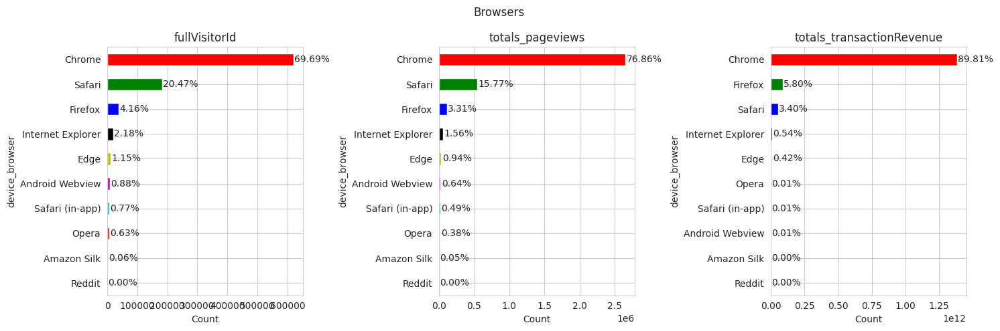

In [ ]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot each column in a separate subplot
for i, col in enumerate(df_browser.columns):
    df_browser[col].sort_values().plot(kind='barh', ax=axes[i], color=colors)
    axes[i].set_title(col)
    axes[i].set_xlabel('Count')

    total = df_browser[col].sum()

    for c in axes[i].containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        axes[i].bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.suptitle('Browsers')
plt.tight_layout()
plt.show()

>**Observations:**
   
- Not suprising, Chrome is the powerhouse in all 3 fields, especially in    
    generating the revenues, close to 90 percent of the market share.
- Surprisingly, both Safari & Firefox outperforms Internet Explorer & Edge    
    in all 3 fields.


### 3.3 'device_operatingSystem'

In [ ]:
df_os = df_train.groupby('device_operatingSystem').agg(aggregations
                ).sort_values(by='totals_transactionRevenue', ascending=False).head(10)

df_os

,fullVisitorId,totals_pageviews,totals_transactionRevenue
device_operatingSystem,,,
Macintosh,253938,"1,174,947","856,375,790,000"
Windows,350072,"1,133,707","397,312,720,000"
Chrome OS,26337,"168,146","183,937,750,000"
Linux,35034,"169,799","43,910,400,000"
Android,123892,"425,621","36,341,280,000"
iOS,107665,"392,002","22,166,900,000"
Windows Phone,1216,"3,229","26,400,000"
OpenBSD,2,9,0
Xbox,66,160,0


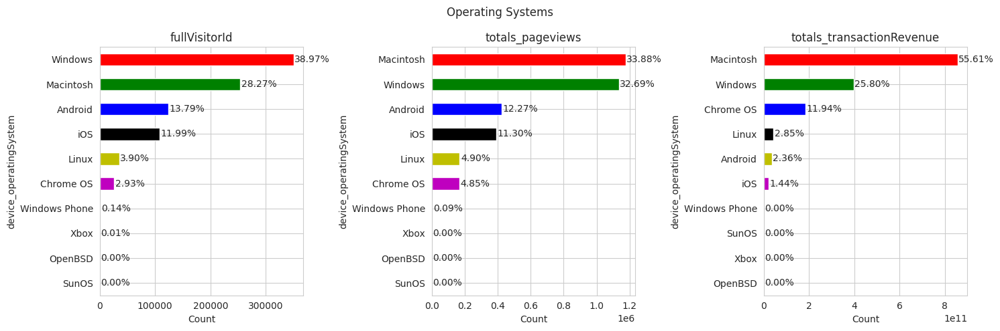

In [ ]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot each column in a separate subplot
for i, col in enumerate(df_os.columns):
    df_os[col].sort_values().plot(kind='barh', ax=axes[i], color=colors)
    axes[i].set_title(col)
    axes[i].set_xlabel('Count')

    total = df_os[col].sum()

    for c in axes[i].containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        axes[i].bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.suptitle('Operating Systems')
plt.tight_layout()
plt.show()

### 3.4 'device_isMobile'

In [ ]:
df_mobile = df_train.groupby('device_isMobile').agg(aggregations
                ).sort_values(by='totals_transactionRevenue', ascending=False)

df_mobile

,fullVisitorId,totals_pageviews,totals_transactionRevenue
device_isMobile,,,
False,664530,"2,642,515","1,480,831,630,000"
True,239123,"835,951","59,239,610,000"


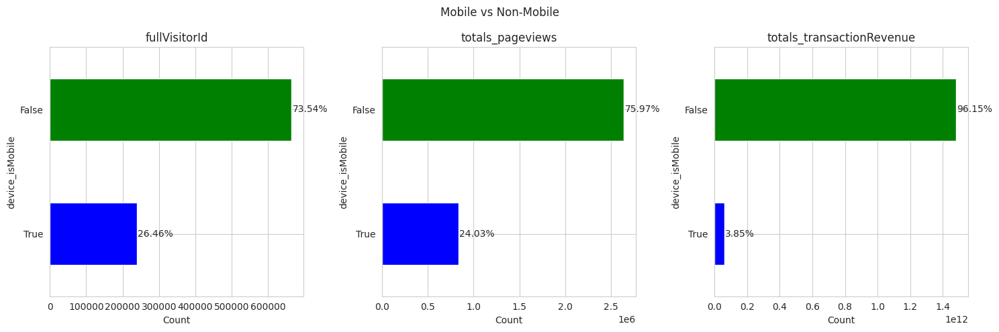

In [ ]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Flatten the 2D array of axes
axes = axes.flatten()

# Plot each column in a separate subplot
for i, col in enumerate(df_mobile.columns):
    df_mobile[col].sort_values().plot(kind='barh', ax=axes[i], color=colors)
    axes[i].set_title(col)
    axes[i].set_xlabel('Count')

    total = df_mobile[col].sum()

    for c in axes[i].containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        axes[i].bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.suptitle('Mobile vs Non-Mobile')
plt.tight_layout()
plt.show()

### 3.5 'device.deviceCategory'

In [ ]:
df_category = df_train.groupby('device_deviceCategory').agg(aggregations
                ).sort_values(by='totals_transactionRevenue', ascending=False).head(10)

df_category

,fullVisitorId,totals_pageviews,totals_transactionRevenue
device_deviceCategory,,,
desktop,664479,"2,642,573","1,480,864,090,000"
mobile,208725,"713,646","49,785,810,000"
tablet,30449,"122,247","9,421,340,000"


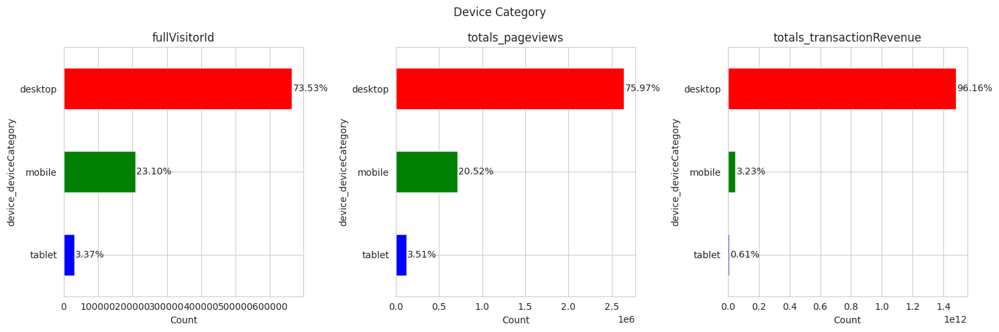

In [ ]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot each column in a separate subplot
for i, col in enumerate(df_category.columns):
    df_category[col].sort_values().plot(kind='barh', ax=axes[i], color=colors)
    axes[i].set_title(col)
    axes[i].set_xlabel('Count')

    total = df_category[col].sum()

    for c in axes[i].containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        axes[i].bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.suptitle('Device Category')
plt.tight_layout()
plt.show()

>**Observations:**

desktop & non-mobile devices
- still dominate in bring in traffics, pageviews & revenues

In [ ]:
device_cols = ["device_browser", "device_deviceCategory", "device_operatingSystem"]

colors = ["#d6a5ff", "#fca6da", "#f4d39c", "#a9fcca"]
traces = []
for i, col in enumerate(device_cols):
    t = train[col].value_counts()
    traces.append(go.Bar(marker=dict(color=colors[i]),orientation="h", y = t.index[:15][::-1], x = t.values[:15][::-1]))

fig = tools.make_subplots(rows=1, cols=3, subplot_titles=["Visits: Category", "Visits: Browser","Visits: OS"], print_grid=False)
fig.append_trace(traces[1], 1, 1)
fig.append_trace(traces[0], 1, 2)
fig.append_trace(traces[2], 1, 3)

fig['layout'].update(height=400, showlegend=False, title="Visits by Device Attributes")
iplot(fig)

## convert transaction revenue to float
train["totals_transactionRevenue"] = train["totals_transactionRevenue"].astype('float')

device_cols = ["device_browser", "device_deviceCategory", "device_operatingSystem"]

fig = tools.make_subplots(rows=1, cols=3, subplot_titles=["Mean Revenue: Category", "Mean Revenue: Browser","Mean Revenue: OS"], print_grid=False)

colors = ["red", "green", "purple"]
trs = []
for i, col in enumerate(device_cols):
    tmp = train.groupby(col).agg({"totals_transactionRevenue": "mean"}).reset_index().rename(columns={"totals_transactionRevenue" : "Mean Revenue"})
    tmp = tmp.dropna().sort_values("Mean Revenue", ascending = False)
    tr = go.Bar(x = tmp["Mean Revenue"][::-1], orientation="h", marker=dict(opacity=0.5, color=colors[i]), y = tmp[col][::-1])
    trs.append(tr)

fig.append_trace(trs[1], 1, 1)
fig.append_trace(trs[0], 1, 2)
fig.append_trace(trs[2], 1, 3)
fig['layout'].update(height=400, showlegend=False, title="Mean Revenue by Device Attributes")
iplot(fig)

###  GeoNetwork Attributes

In [ ]:
geo_cols = ['geoNetwork_city', 'geoNetwork_continent','geoNetwork_country',
            'geoNetwork_metro', 'geoNetwork_networkDomain', 'geoNetwork_region','geoNetwork_subContinent']
geo_cols = ['geoNetwork_continent','geoNetwork_subContinent']

colors = ["#d6a5ff", "#fca6da"]
fig = tools.make_subplots(rows=1, cols=2, subplot_titles=["Visits : GeoNetwork Continent", "Visits : GeoNetwork subContinent"], print_grid=False)
trs = []
for i,col in enumerate(geo_cols):
    t = train[col].value_counts()
    tr = go.Bar(x = t.index[:20], marker=dict(color=colors[i]), y = t.values[:20])
    trs.append(tr)

fig.append_trace(trs[0], 1, 1)
fig.append_trace(trs[1], 1, 2)
fig['layout'].update(height=400, margin=dict(b=150), showlegend=False)
iplot(fig)




geo_cols = ['geoNetwork_continent','geoNetwork_subContinent']
fig = tools.make_subplots(rows=1, cols=2, subplot_titles=["Mean Revenue: Continent", "Mean Revenue: SubContinent"], print_grid=False)

colors = ["blue", "orange"]
trs = []
for i, col in enumerate(geo_cols):
    tmp = train.groupby(col).agg({"totals_transactionRevenue": "mean"}).reset_index().rename(columns={"totals_transactionRevenue" : "Mean Revenue"})
    tmp = tmp.dropna().sort_values("Mean Revenue", ascending = False)
    tr = go.Bar(y = tmp["Mean Revenue"], orientation="v", marker=dict(opacity=0.5, color=colors[i]), x= tmp[col])
    trs.append(tr)

fig.append_trace(trs[0], 1, 1)
fig.append_trace(trs[1], 1, 2)
fig['layout'].update(height=450, margin=dict(b=200), showlegend=False)
iplot(fig)

## 4. 'geoNetwork' columns

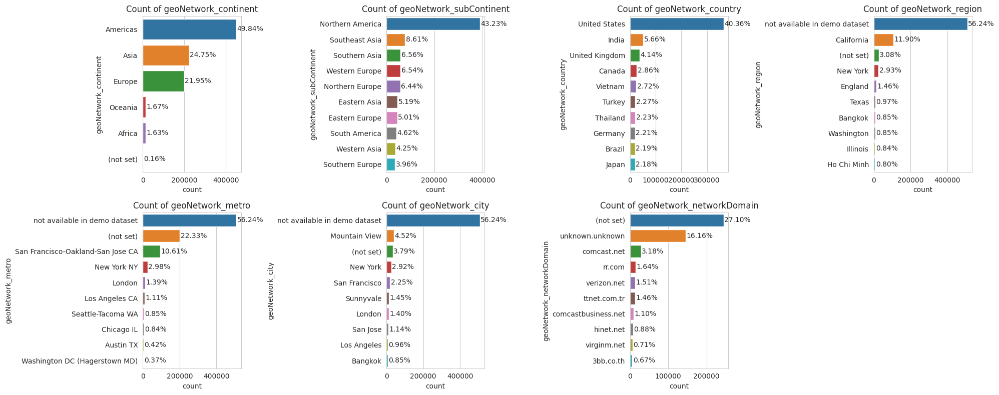

In [ ]:
geo_columns = ['geoNetwork_continent', 'geoNetwork_subContinent', 'geoNetwork_country',
               'geoNetwork_region', 'geoNetwork_metro', 'geoNetwork_city', 'geoNetwork_networkDomain']

fig, ax = plt.subplots(figsize=(20, 8))

for i, col in enumerate(geo_columns, 1):
    plt.subplot(2, 4, i)

    ax = sns.countplot(y=train[col], order=train[col].value_counts()[:10].index,  )
    plt.title(f'Count of {col}')

    total = len(train[col])

    for c in ax.containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        ax.bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.tight_layout()
plt.show()

# Explicitly close the figure to remove overlapping axes
plt.close(fig)

### 4.1 Global Analysis

In [ ]:
df_country = df_train.groupby('geoNetwork_country').agg(aggregations
                    ).sort_values(by=['totals_transactionRevenue'],
                                  ascending=False).reset_index()
df_country.head(10)

,geoNetwork_country,fullVisitorId,totals_pageviews,totals_transactionRevenue
0,United States,364744,"2,031,910","1,452,440,650,000"
1,Canada,25869,"131,366","32,824,540,000"
2,Venezuela,2132,"17,441","13,374,900,000"
3,Japan,19731,"63,152","6,728,990,000"
4,Kenya,771,"2,130","5,268,700,000"
5,Nigeria,1446,"3,198","3,302,400,000"
6,Taiwan,12996,"47,481","1,920,890,000"
7,Indonesia,9273,"21,529","1,840,380,000"
8,Australia,12698,"41,288","1,745,260,000"
9,United Kingdom,37393,"93,859","1,689,450,000"


In [ ]:
# Create basic choropleth map
fig = px.choropleth(df_country, locationmode='country names', locations='geoNetwork_country',
                    color=df_country['totals_transactionRevenue'], color_continuous_scale='Mint',
                    hover_name='geoNetwork_country',  hover_data={'totals_transactionRevenue':':,.0f'},
                    title='Revenue by Country')

fig.update_layout(width=800, height=400, autosize=False,
                  margin=dict(l=30, r=30, t=50, b=50, pad=10))

fig.show(renderer='notebook')
# fig.write_html("interactive_map.html")

### 4.2 US Analysis

In [ ]:
df_us = df_train[df_train['geoNetwork_country'] == 'United States'].reset_index(drop=True)
df_us

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,geoNetwork_region,totals_hits,totals_pageviews,totals_bounces,totals_transactionRevenue,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType
0,Referral,20160902,3746051970600816343,3746051970600816343_1472843059,2,Chrome,Linux,False,desktop,United States,California,1,1,1,0,sites.google.com,referral,others
1,Referral,20160902,2486407044795377188,2486407044795377188_1472830426,1,Chrome,Windows,False,desktop,United States,not available in demo dataset,1,1,1,0,siliconvalley.about.com,referral,others
2,Paid Search,20160902,2870162892603227525,2870162892603227525_1472858877,1,Chrome,Android,True,mobile,United States,not available in demo dataset,1,1,1,0,google,cpc,Google Search
3,Referral,20160902,1467563877243766337,1467563877243766337_1472873256,1,Safari,iOS,True,tablet,United States,not available in demo dataset,1,1,1,0,siliconvalley.about.com,referral,others
4,Organic Search,20160902,0504414286758319636,0504414286758319636_1472812649,1,Chrome,Windows,False,desktop,United States,New York,1,1,1,0,baidu,organic,others
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364739,Social,20170104,8051164218376407640,8051164218376407640_1483561580,3,Chrome,Macintosh,False,desktop,United States,California,5,5,0,0,facebook.com,referral,others
364740,Social,20170104,05448851847875728,05448851847875728_1483533179,1,Chrome,Android,True,mobile,United States,not available in demo dataset,7,7,0,0,youtube.com,referral,others
364741,Social,20170104,056144239667131330,056144239667131330_1483600246,4,Chrome,Macintosh,False,desktop,United States,California,11,10,0,0,groups.google.com,referral,others
364742,Social,20170104,256641390199759052,256641390199759052_1483556333,1,Chrome,iOS,True,tablet,United States,not available in demo dataset,11,7,0,0,m.youtube.com,referral,others


In [ ]:
# Add a column with state abbreviations
state_abbreviations = {'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA',
                       'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE', 'Florida': 'FL', 'Georgia': 'GA',
                       'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA',
                       'Kansas': 'KS', 'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD',
                       'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS',
                       'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
                       'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
                       'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA',
                       'Rhode Island': 'RI', 'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN',
                       'Texas': 'TX', 'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA',
                       'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY', 'District of Columbia': 'DC' }

df_us['stateCode'] = df_us['geoNetwork_region'].map(state_abbreviations)
df_us.head()

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,geoNetwork_region,totals_hits,totals_pageviews,totals_bounces,totals_transactionRevenue,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType,stateCode
0,Referral,20160902,3746051970600816343,3746051970600816343_1472843059,2,Chrome,Linux,False,desktop,United States,California,1,1,1,0,sites.google.com,referral,others,CA
1,Referral,20160902,2486407044795377188,2486407044795377188_1472830426,1,Chrome,Windows,False,desktop,United States,not available in demo dataset,1,1,1,0,siliconvalley.about.com,referral,others,NaN
2,Paid Search,20160902,2870162892603227525,2870162892603227525_1472858877,1,Chrome,Android,True,mobile,United States,not available in demo dataset,1,1,1,0,google,cpc,Google Search,NaN
3,Referral,20160902,1467563877243766337,1467563877243766337_1472873256,1,Safari,iOS,True,tablet,United States,not available in demo dataset,1,1,1,0,siliconvalley.about.com,referral,others,NaN
4,Organic Search,20160902,0504414286758319636,0504414286758319636_1472812649,1,Chrome,Windows,False,desktop,United States,New York,1,1,1,0,baidu,organic,others,NY


In [ ]:
df_states = df_us.groupby(['geoNetwork_region', 'stateCode']).agg(aggregations).sort_values(
                                            by='totals_transactionRevenue', ascending=False).reset_index()
df_states.head(10)

,geoNetwork_region,stateCode,fullVisitorId,totals_pageviews,totals_transactionRevenue
0,California,CA,106892,"642,041","373,459,190,000"
1,New York,NY,26290,"173,607","217,992,880,000"
2,Illinois,IL,7571,"46,761","72,850,610,000"
3,Washington,WA,7613,"41,924","35,141,160,000"
4,Texas,TX,8734,"50,421","28,658,860,000"
5,Michigan,MI,2575,"19,559","26,671,310,000"
6,Massachusetts,MA,2636,"16,170","22,888,080,000"
7,Virginia,VA,3096,"16,065","22,115,920,000"
8,Georgia,GA,2474,"13,944","17,569,820,000"
9,District of Columbia,DC,2529,"13,306","10,610,570,000"


In [ ]:
# Create basic choropleth map
fig = px.choropleth(df_states, locationmode='USA-states', locations='stateCode',
                    color=df_states['totals_transactionRevenue'], hover_name='geoNetwork_region',
                    hover_data={'totals_transactionRevenue':':,.0f'},
                    title='Revenue by State', color_continuous_scale='Mint')

fig.update_layout(width=800, height=400, autosize=False, geo_scope='usa',
                  margin=dict(l=30, r=30, t=50, b=50, pad=10))

# For interactive display in a Jupyter Notebook:
fig.show(renderer='notebook')
# fig.show()

## 6. 'trafficSource' Columns

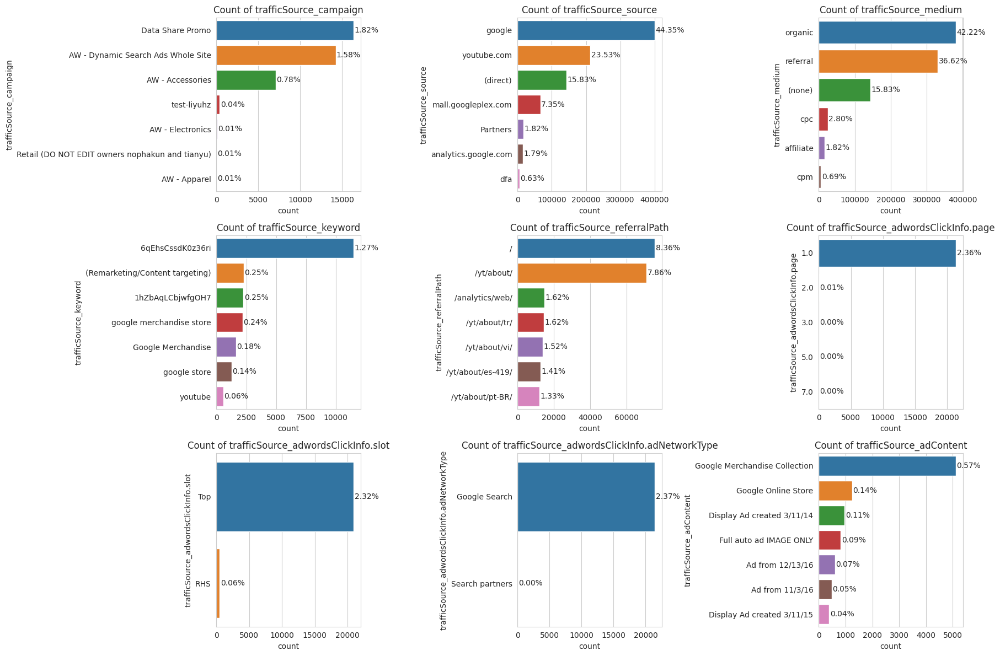

In [ ]:
traffic_columns = ['trafficSource_campaign', 'trafficSource_source', 'trafficSource_medium',
                   'trafficSource_keyword', 'trafficSource_referralPath',
                   'trafficSource_adwordsClickInfo.page', 'trafficSource_adwordsClickInfo.slot',
                   'trafficSource_adwordsClickInfo.adNetworkType', 'trafficSource_adContent']

fig, ax = plt.subplots(figsize=(18, 12))

for i, col in enumerate(traffic_columns, 1):
    plt.subplot(3, 3, i)

    # Exclude 'others' & '(not set)' from the specified column
    filtered_df = train[(train[col] != 'others') &
                        (train[col] != '(not provided)') &
                        (train[col] != '(not set)')]

    ax = sns.countplot(y=filtered_df[col], order=filtered_df[col].value_counts()[:7].index)
    plt.title(f'Count of {col}')

    total = len(train[col])

    for c in ax.containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        ax.bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.tight_layout()
plt.show()

# Explicitly close the figure to remove overlapping axes
plt.close(fig)

In this section, we have excluded 'others' & '(not set)' from the specified columns for they comprise    
an overwhelming large part of the data in this section.

We are only interested in the foloowing features:   

- 'trafficSource.source'    
- 'trafficSource.medium'   

### 6.1 'trafficSource.source'

- The source of the traffic source. Could be the name of the search engine, etc.
- Top 10 sources are:   
    'google', 'youtube.com', '(direct)', 'mall.googleplex.com', 'Partners',   
    'analytics.google.com', 'dfa', 'google.com', 'm.facebook.com', 'baidu'.      
    google: 44% of the trafficsource source

In [ ]:
df_source = df_train.groupby('trafficSource_source').agg(aggregations
                ).sort_values(by='totals_transactionRevenue', ascending=False).head(10)

df_source

,fullVisitorId,totals_pageviews,totals_transactionRevenue
trafficSource_source,,,
mall.googleplex.com,66416,"570,690","612,968,030,000"
(direct),143028,"584,842","434,840,550,000"
google,400788,"1,687,154","368,965,360,000"
dfa,5686,"31,043","76,928,420,000"
mail.google.com,1457,"8,857","23,327,910,000"
dealspotr.com,528,"3,313","5,690,640,000"
sites.google.com,2983,"14,744","4,390,780,000"
gdeals.googleplex.com,1063,"3,822","2,175,540,000"
groups.google.com,1025,"4,249","1,631,260,000"


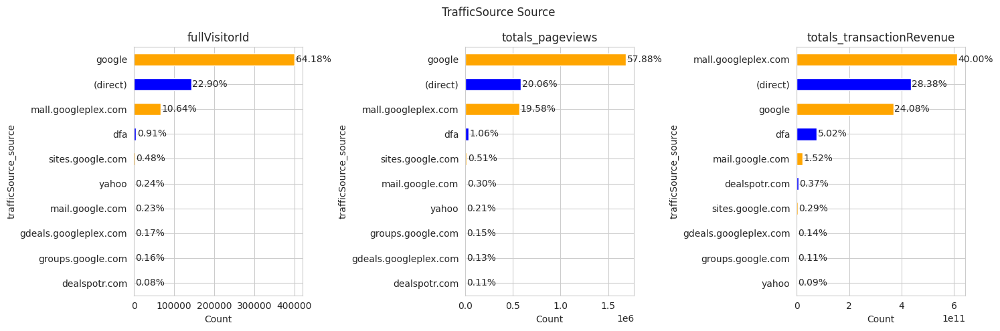

In [ ]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot each column in a separate subplot
for i, col in enumerate(df_source.columns):
    df_source[col].sort_values().plot(kind='barh', ax=axes[i], color=colors)
    axes[i].set_title(col)
    axes[i].set_xlabel('Count')

    total = df_source[col].sum()

    for c in axes[i].containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        axes[i].bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.suptitle('TrafficSource Source')
plt.tight_layout()
plt.show()

>**Observations:**

'trafficSource_source'    
    
- 'google' brings in most of the users & pageviews, while 'mall.googleplex.com' generates most of the revenues.
- '(direct)' ranks second in all 3 fields. No wonder again, users know what they want & type the urls in the browser.
- 'dfa': DFA source refers to DoubleClick For Advertisers, which is the old brand name for Google Marketing Platform.

### 6.2 'trafficSource_medium'

- The medium of the traffic source. "organic", "cpc", "referral", etc,   
- Top 6 sources are:   
    'organic', 'referral', '(none)', 'cpc', 'affiliate', 'cpm', etc.   
    organic: 42% of the traffucesource medium

In [ ]:
df_medium = df_train.groupby('trafficSource_medium').agg(aggregations
                ).sort_values(by='totals_transactionRevenue', ascending=False).head(10)

df_medium

,fullVisitorId,totals_pageviews,totals_transactionRevenue
trafficSource_medium,,,
referral,330955,"1,106,287","656,346,450,000"
(none),143026,"584,840","434,840,550,000"
organic,381561,"1,569,218","326,380,510,000"
cpm,6262,"34,202","78,337,460,000"
cpc,25326,"136,060","43,558,900,000"
affiliate,16403,"47,417","597,380,000"
others,120,442,"9,990,000"


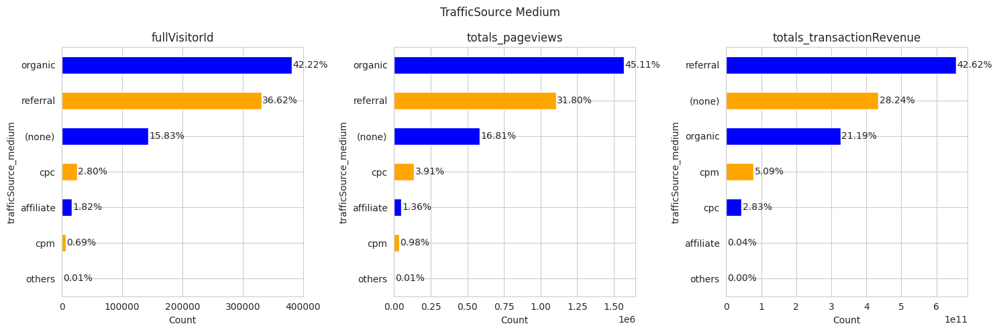

In [ ]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot each column in a separate subplot
for i, col in enumerate(df_medium.columns):
    df_medium[col].sort_values().plot(kind='barh', ax=axes[i], color=colors)
    axes[i].set_title(col)
    axes[i].set_xlabel('Count')

    total = df_medium[col].sum()

    for c in axes[i].containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        axes[i].bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.suptitle('TrafficSource Medium')
plt.tight_layout()
plt.show()

>**Observations:**

- "organic" bring about most of the sessions & pageviews, it is   
    "referral" that generates most of the revenues.
- "cpc": Cost Per Click. Plays an important role in all 3 fields.
- '(none)': means Analytics doesn't have any referral information for these users.

#### 6.3 Source & Medium

In [ ]:
df_source_medium = df_train.groupby(['trafficSource_source', 'trafficSource_medium']).agg(aggregations)

# df_source_medium.sort_values(by='revenue', ascending=False).head(10)
df_source_medium

fullVisitorId  \
trafficSource_source                               trafficSource_medium                  
(direct)                                           (none)                       143026   
                                                   cpm                               2   
0.muppet1.frontend.gws.muppet-exp.ij-q.borg.goo... referral                          1   
0.shared.bow.cat2.ads-bow.lf.borg.google.com:9817  referral                          1   
0.shared.bow.cat2.ads-bow.lf.borg.google.com:9824  referral                          1   
...                                                                                ...   
yahoo                                              others                            2   
yahoo.com                                          referral                          1   
yandex                                             organic                           3   
youtube.com                                        referral                     212602   
yt-go-12345.googleplex.com                         referral                          1   

                                                                         totals_pageviews  \
trafficSource_source                               trafficSource_medium                     
(direct)                                           (none)                         584,840   
                                                   cpm                                  2   
0.muppet1.frontend.gws.muppet-exp.ij-q.borg.goo... referral                             2   
0.shared.bow.cat2.ads-bow.lf.borg.google.com:9817  referral                             3   
0.shared.bow.cat2.ads-bow.lf.borg.google.com:9824  referral                             2   
...                                                                                   ...   
yahoo                                              others                               3   
yahoo.com                                          referral                             5   
yandex                                             organic                              8   
youtube.com                                        referral                       354,789   
yt-go-12345.googleplex.com                         referral                             1   

                                                                         totals_transactionRevenue  
trafficSource_source                               trafficSource_medium                             
(direct)                                           (none)                          434,840,550,000  
                                                   cpm                                           0  
0.muppet1.frontend.gws.muppet-exp.ij-q.borg.goo... referral                                      0  
0.shared.bow.cat2.ads-bow.lf.borg.google.com:9817  referral                                      0  
0.shared.bow.cat2.ads-bow.lf.borg.google.com:9824  referral                                      0  
...                                                                                            ...  
yahoo                                              others                                        0  
yahoo.com                                          referral                                      0  
yandex                                             organic                                       0  
youtube.com                                        referral                            314,070,000  
yt-go-12345.googleplex.com                         referral                                      0  

[387 rows x 3 columns]

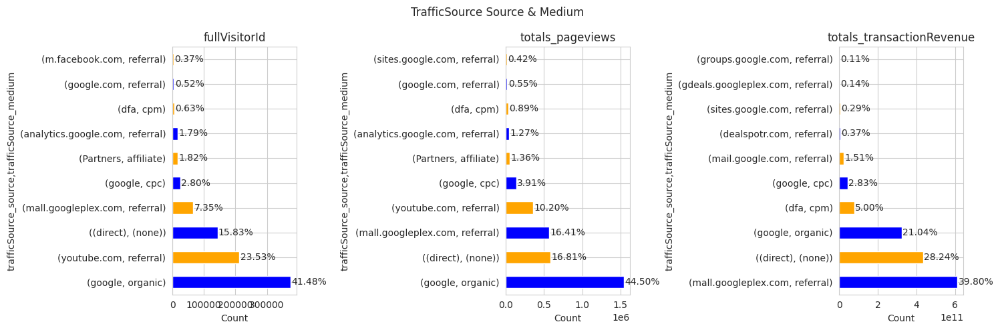

In [ ]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
# Flatten the 2D array of axes
# axes = axes.flatten()

# Plot each column in a separate subplot
for i, col in enumerate(df_source_medium.columns):
    df_source_medium[col].sort_values(ascending=False)[:10].plot(kind='barh', ax=axes[i], color=colors)
    axes[i].set_title(col)
    axes[i].set_xlabel('Count')

    total = df_source_medium[col].sum()

    for c in axes[i].containers:
        percentages = [f'{(v / total) * 100:.2f}%' for v in c.datavalues]
        axes[i].bar_label(c, labels=percentages, fmt='%s', padding=1)

plt.suptitle('TrafficSource Source & Medium')
plt.tight_layout()
plt.show()

>**Observations:**

- 'google organic' generates most of the traffics, the rererrals from    
    'mall.googleplex.com' generates most of the revenue.
- 'direct none': again, Analytics does not have any information about users,   
    yet are dominant in all 3 fields on average after 'google organic'.

## 7. Revenue = 0 vs Revenue > 0

In [ ]:
# revenue = 0 transactions
df_revenue_zero = df_train[df_train['totals_transactionRevenue'] == 0]
df_revenue_zero.head()

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,geoNetwork_region,totals_hits,totals_pageviews,totals_bounces,totals_transactionRevenue,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType
0,Organic Search,20160902,1131660440785968503,1131660440785968503_1472830385,1,Chrome,Windows,False,desktop,Turkey,Izmir,1,1,1,0,google,organic,others
1,Organic Search,20160902,377306020877927890,377306020877927890_1472880147,1,Firefox,Macintosh,False,desktop,Australia,not available in demo dataset,1,1,1,0,google,organic,others
2,Organic Search,20160902,3895546263509774583,3895546263509774583_1472865386,1,Chrome,Windows,False,desktop,Spain,Community of Madrid,1,1,1,0,google,organic,others
3,Organic Search,20160902,4763447161404445595,4763447161404445595_1472881213,1,UC Browser,Linux,False,desktop,Indonesia,not available in demo dataset,1,1,1,0,google,organic,others
4,Organic Search,20160902,27294437909732085,27294437909732085_1472822600,2,Chrome,Android,True,mobile,United Kingdom,not available in demo dataset,1,1,1,0,google,organic,others


In [ ]:
# revenue > 0 transactions
df_revenue_nonzero = df_train[df_train['totals_transactionRevenue'] > 0].reset_index(drop=True)
df_revenue_nonzero.head()

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,geoNetwork_region,totals_hits,totals_pageviews,totals_bounces,totals_transactionRevenue,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType
0,Direct,20160902,6194193421514403509,6194193421514403509_1472843572,1,Chrome,Linux,False,desktop,United States,Michigan,11,11,0,"37,860,000",(direct),(none),others
1,Organic Search,20160902,5327166854580374902,5327166854580374902_1472844906,3,Chrome,Macintosh,False,desktop,United States,New York,11,10,0,"306,670,000",google,organic,others
2,Referral,20160902,8885051388942907862,8885051388942907862_1472827393,7,Chrome,Linux,False,desktop,United States,New York,13,11,0,"68,030,000",mall.googleplex.com,referral,others
3,Referral,20160902,0185467632009737931,0185467632009737931_1472846398,6,Chrome,Windows,False,desktop,United States,California,13,12,0,"26,250,000",mall.googleplex.com,referral,others
4,Referral,20160902,3244885836845029978,3244885836845029978_1472824817,4,Chrome,Macintosh,False,desktop,United States,not available in demo dataset,17,14,0,"574,150,000",mall.googleplex.com,referral,others


In [ ]:
non_zero_transact_pct = len(df_revenue_nonzero) / len(df_train) * 100
print(f'Non-Zero Transaction Percentage: {non_zero_transact_pct:.02f}%')

zero_transact_pct = len(df_revenue_zero) / len(df_train) * 100
print(f'Zero Transaction Percentage: {zero_transact_pct:.02f}%')

Non-Zero Transaction Percentage: 1.27%
Zero Transaction Percentage: 98.73%


>***Observations:***

- 98.73% of the traffics (sessions, pageviews) does not generate revenues at all.

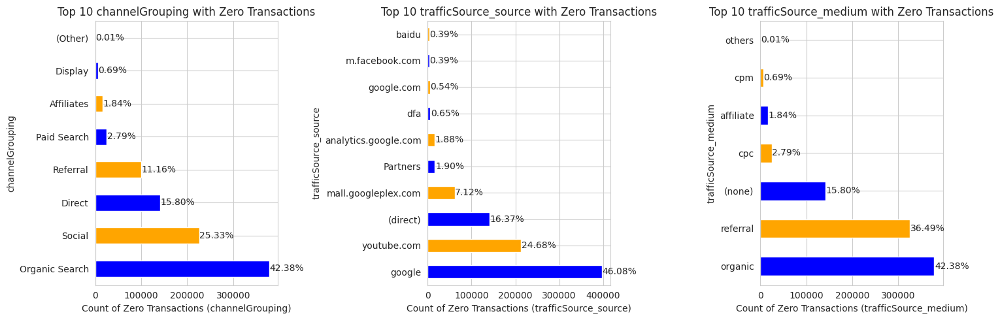

In [ ]:
# Filter the DataFrame for zero revenue
# df_revenue_zero = df_train[df_train['totals.transactionRevenue'] == 0]

# List of columns to loop through
columns_to_loop = ['channelGrouping', 'trafficSource_source', 'trafficSource_medium']

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Loop through each column and subplot
for i, column in enumerate(columns_to_loop):
    # Create the aggregated DataFrame
    df_column_revenue_zero = df_revenue_zero.groupby(column).agg(
        count=(column, 'count') ).sort_values(by='count', ascending=False).head(10)

    # Calculate the percentage
    total_count = df_column_revenue_zero['count'].sum()
    df_column_revenue_zero['percentage'] = (df_column_revenue_zero['count'] / total_count) * 100

    # Plot the horizontal bar chart in the current subplot
    bar_chart = df_column_revenue_zero['count'].plot(kind='barh', ax=axs[i], color=colors)

    # Add labels and title
    axs[i].set_xlabel(f'Count of Zero Transactions ({column})')
    axs[i].set_ylabel(column)
    axs[i].set_title(f'Top 10 {column} with Zero Transactions')

    # Display percentages on the right side of the bars
    for j, patch in enumerate(bar_chart.patches):
        width = patch.get_width()
        percentage = df_column_revenue_zero['percentage'].iloc[j]
        axs[i].text(width + 1000, patch.get_y() + patch.get_height() / 2,
                    f'{percentage:.2f}%', ha='left', va='center', fontsize=10)

plt.tight_layout()
plt.show()

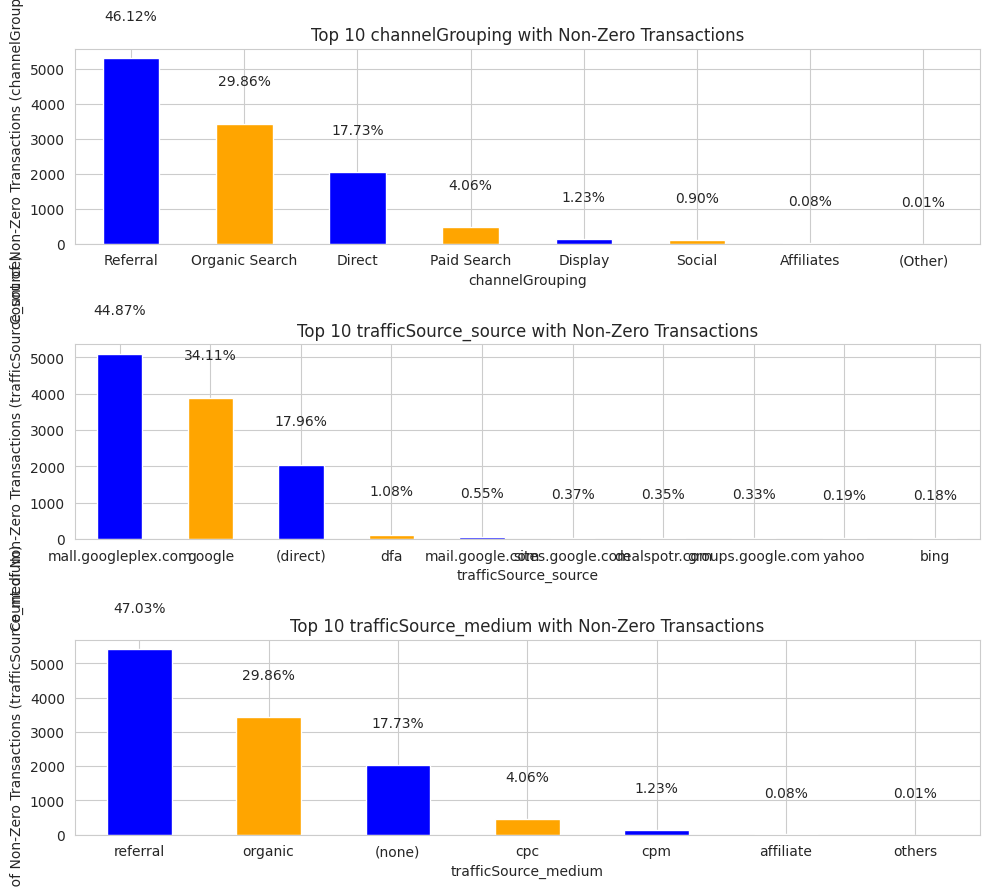

In [ ]:
# Filter the DataFrame for non-zero revenue
# df_revenue_nonzero = df_train[df_train['totals_transactionRevenue'] > 0]

# List of columns to loop through
columns_to_loop = ['channelGrouping', 'trafficSource_source', 'trafficSource_medium']

# Plot the bar chart
fig, ax = plt.subplots(3, 1, figsize=(10, 9))

# Loop through each column
for i, col in enumerate(columns_to_loop):
    # Create the aggregated DataFrame
    df_column_revenue_nonzero = df_revenue_nonzero.groupby(col).agg(
        count=(col, 'count')
    ).sort_values(by='count', ascending=False).head(10)

    # Calculate the percentage
    total_count = df_column_revenue_nonzero['count'].sum()
    df_column_revenue_nonzero['percentage'] = (df_column_revenue_nonzero['count'] / total_count) * 100

    bar_chart = df_column_revenue_nonzero['count'].plot(kind='bar', rot=0, ax=ax[i], color=colors)

    # Add labels and title
    ax[i].set_ylabel(f'Count of Non-Zero Transactions ({col})')
    ax[i].set_xlabel(col)
    ax[i].set_title(f'Top 10 {col} with Non-Zero Transactions')

    # Display percentages on top of the bars
    for j, patch in enumerate(bar_chart.patches):
        height = patch.get_height()
        percentage = df_column_revenue_nonzero['percentage'].iloc[j]
        ax[i].text(patch.get_x() + patch.get_width() / 2,
                height + 1000, f'{percentage:.2f}%', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

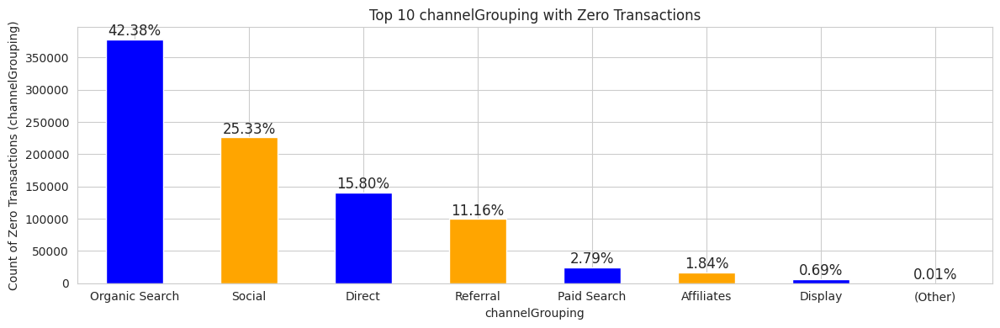

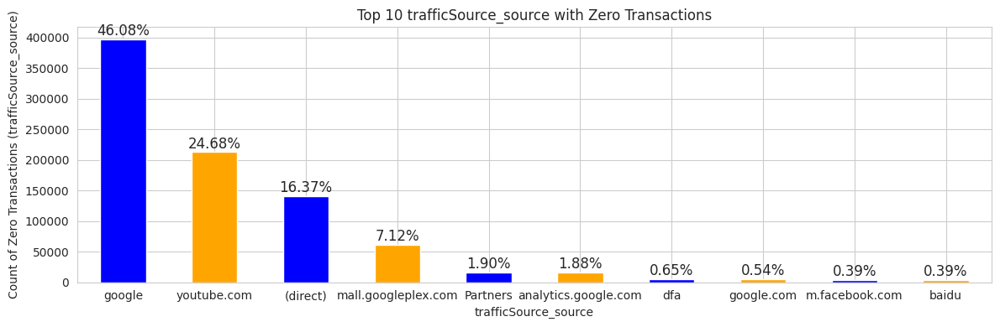

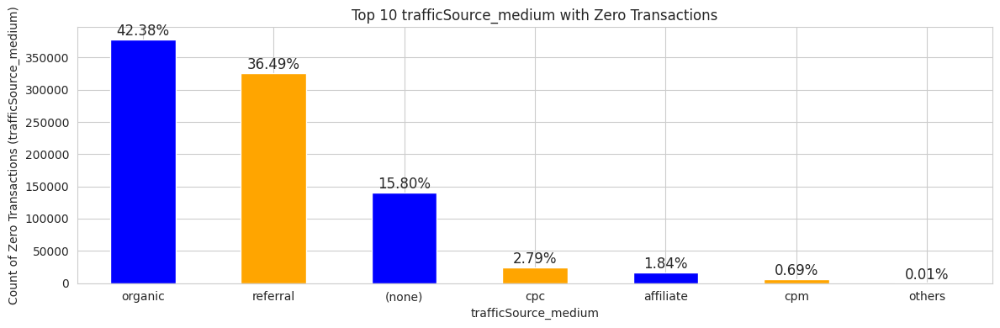

In [ ]:
# Filter the DataFrame for zero revenue
# df_revenue_zero = df_train[df_train['totals_transactionRevenue'] == 0]

# List of columns to loop through
columns_to_loop = ['channelGrouping', 'trafficSource_source', 'trafficSource_medium']

# Loop through each column
for col in columns_to_loop:
    # Create the aggregated DataFrame
    df_column_revenue_zero = df_revenue_zero.groupby(col).agg(
        count=(col, 'count')
    ).sort_values(by='count', ascending=False).head(10)

    # Calculate the percentage
    total_count = df_column_revenue_zero['count'].sum()
    df_column_revenue_zero['percentage'] = (df_column_revenue_zero['count'] / total_count) * 100

    # Plot the bar chart
    fig, ax = plt.subplots(figsize=(12, 4))
    # Flatten the 2D array of axes
    # axes = axes.flatten()

    bar_chart = df_column_revenue_zero['count'].plot(kind='bar', rot=0, ax=ax, color=colors)

    # Add labels and title
    ax.set_ylabel(f'Count of Zero Transactions ({col})')
    ax.set_xlabel(col)
    ax.set_title(f'Top 10 {col} with Zero Transactions')

    # Display percentages on top of the bars
    for i, patch in enumerate(bar_chart.patches):
        height = patch.get_height()
        percentage = df_column_revenue_zero['percentage'].iloc[i]
        ax.text(patch.get_x() + patch.get_width() / 2,
                height + 1000, f'{percentage:.2f}%', ha='center', va='bottom', fontsize=12)

    plt.tight_layout()
    plt.show()

>**Observations:**

- Most of the zero-revenue transacations are from 'organic search' or 'search google'
- while most of the non-zero transactions are from 'mall.googleplex.com' & 'referral',    
    '(direct)' plays an important role in bringing about traffics & revenues.

## 8. User & Session Analysis

### 8.1 User Analysis

In [ ]:
df_visitors = df_train.groupby('fullVisitorId').agg(aggregations).sort_values(
                    by='totals_transactionRevenue', ascending=False )

df_visitors.drop('fullVisitorId', axis=1).head(10)

,totals_pageviews,totals_transactionRevenue
fullVisitorId,,
1957458976293878100,"4,160","77,113,430,000"
5632276788326171571,105,"16,023,750,000"
9417857471295131045,466,"15,170,120,000"
4471415710206918415,209,"11,211,100,000"
4984366501121503466,540,"9,513,900,000"
9089132392240687728,670,"8,951,970,000"
9029794295932939024,574,"7,846,350,000"
7463172420271311409,539,"7,225,100,000"
7311242886083854158,773,"7,143,250,000"


In [ ]:
# Users with non-zero revenue transactions
df_users_revenue = df_revenue_nonzero.groupby('fullVisitorId').agg(aggregations
                ).sort_values(by='totals_transactionRevenue', ascending=False)

df_users_revenue.drop('fullVisitorId', axis=1)

,totals_pageviews,totals_transactionRevenue
fullVisitorId,,
1957458976293878100,698,"77,113,430,000"
5632276788326171571,89,"16,023,750,000"
9417857471295131045,302,"15,170,120,000"
4471415710206918415,72,"11,211,100,000"
4984366501121503466,478,"9,513,900,000"
...,...,...
9367883304718826385,36,"200,000"
0622280363748067669,67,"160,000"
966739175376367480,138,"90,000"


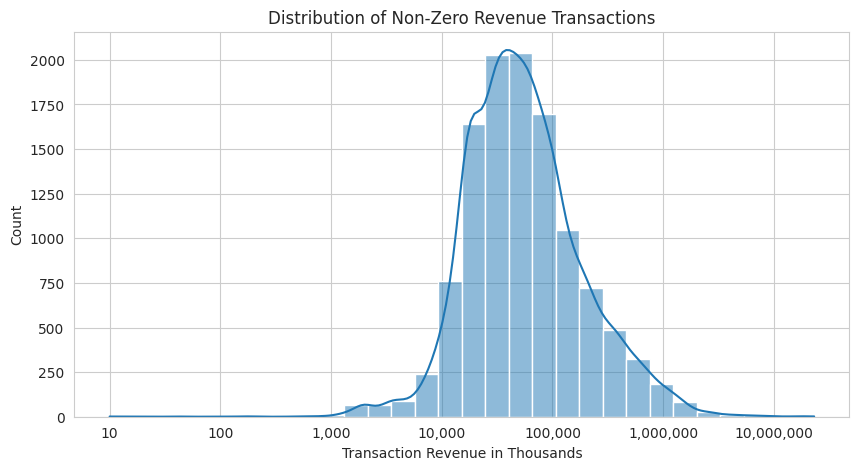

In [ ]:
# Distribution of non-zero revenue transactions
non_zero = df_train[df_train['totals_transactionRevenue'] > 0] \
                 ['totals_transactionRevenue'].reset_index(drop=True)

fig, ax = plt.subplots(figsize=(10, 5))

sns.histplot(non_zero, kde=True, bins=30, log_scale=True)
ticks_x = ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000))
ax.xaxis.set_major_formatter(ticks_x)

plt.title('Distribution of Non-Zero Revenue Transactions')
plt.xlabel('Transaction Revenue in Thousands')

plt.show()

In [ ]:
# Users with zero revenue transactions
df_user_revenue_zero = df_revenue_zero.groupby('fullVisitorId').agg(aggregations
                ).sort_values(by='totals_transactionRevenue', ascending=False)

df_user_revenue_zero.drop('fullVisitorId', axis=1)

,totals_pageviews,totals_transactionRevenue
fullVisitorId,,
0000010278554503158,8,0
667164515185799640,2,0
6671510059486057352,1,0
6671518951911407337,1,0
6671531164062984369,1,0
...,...,...
3339024326532999595,1,0
3339046873192366827,1,0
3339049703930452451,2,0


In [ ]:
df_user_revenue_zero_pct = round(len(df_user_revenue_zero['totals_transactionRevenue']) /
                                 len(df_train['totals_transactionRevenue']) * 100, 2)
print(f'Percentage of users witn zero-revenue trasactions:\n {df_user_revenue_zero_pct}%')

Percentage of users witn zero-revenue trasactions:
 78.67%


### 8.2 Sessions

In [ ]:
# Non-zero revenue sessions
df_session_revenue = df_revenue_nonzero.groupby('sessionId').agg(
                count=('sessionId', 'count'),
                pageviews=('totals_pageviews', 'sum'),
                revenue=('totals_transactionRevenue', 'sum')
                ).sort_values(by='revenue', ascending=False)

df_session_revenue

,count,pageviews,revenue
sessionId,,,
1957458976293878100_1491423580,1,40,"23,129,500,000"
1957458976293878100_1487097028,1,64,"17,855,500,000"
5632276788326171571_1474035643,1,89,"16,023,750,000"
9417857471295131045_1500404409,1,30,"10,589,140,000"
1957458976293878100_1490380560,1,39,"8,677,830,000"
...,...,...,...
9367883304718826385_1471661443,1,36,"200,000"
0622280363748067669_1471996062,1,67,"160,000"
966739175376367480_1473555357,1,138,"90,000"


In [ ]:
# Sessions with zero revenue transactions
df_session_revenue_zero = df_revenue_zero.groupby('sessionId').agg(
                sessions=('sessionId', 'count'),
                pageviews=('totals_pageviews', 'sum'),
                revenue=('totals_transactionRevenue', 'sum')
                ).sort_values(by='revenue', ascending=False)

df_session_revenue_zero

,sessions,pageviews,revenue
sessionId,,,
0000010278554503158_1477029466,1,8,0
6668519818530495903_1486610506,1,1,0
6668422647572885327_1500396504,1,1,0
6668422647572885327_1500489316,1,5,0
6668444911211345974_1484217742,1,8,0
...,...,...,...
3341330889980621436_1490752362,1,1,0
3341336485648984635_1495655311,1,2,0
3341343298322573454_1500420848,1,1,0


In [ ]:
df_session_revenue_zero_pct = round(len(df_session_revenue_zero['revenue']) /
                                    len(df_train['totals_transactionRevenue']) * 100, 2)

print(f'Percentage of sessions witn zero-revenue trasactions:\n {df_session_revenue_zero_pct}%')

Percentage of sessions witn zero-revenue trasactions:
 98.63%


## 9. Time Analysis

### 9.1 Extract 'Year', 'Month', 'Month_Num' & 'Day' from 'date' column

In [ ]:
# Extract 'Year', 'Month', 'Month_Num' & 'Day' from 'date'
def create_features(data):
    """
    Create time series features based on time series index.
    """

    # data = data.copy()

    # Convert 'date' column to datetime series
    data['date'] = pd.to_datetime(data['date'], format='%Y%m%d')

    # Extract 'Year', 'Month', 'Month_Num' & 'Day' from 'Order Date'
    data['Year'] = data.date.dt.year
    data['Month'] = data.date.dt.strftime('%b') # abbrev month name
    data['Month_Num'] = data.date.dt.month
    data['Day'] = data.date.dt.day

    # Extract 'Weekday' & 'Week Day Num'
    data['Weekday'] = data['date'].dt.strftime('%a')
    data['Weekday_Num'] = data.date.dt.day_of_week + 1 # Week start on Monday as 0, so + 1

    return data

In [ ]:
df_train = df_train.copy()

create_features(df_train)

df_train = df_train[df_train['date'] != '2017-08-01']
df_train.tail()

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,...,totals_transactionRevenue,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType,Year,Month,Month_Num,Day,Weekday,Weekday_Num
903648,Social,2017-01-04,5123779100307500332,5123779100307500332_1483554750,1,Chrome,Windows,False,desktop,Puerto Rico,...,0,youtube.com,referral,others,2017,Jan,1,4,Wed,3
903649,Social,2017-01-04,7231728964973959842,7231728964973959842_1483543798,1,Chrome,Android,True,mobile,Sri Lanka,...,0,youtube.com,referral,others,2017,Jan,1,4,Wed,3
903650,Social,2017-01-04,5744576632396406899,5744576632396406899_1483526434,1,Android Webview,Android,True,mobile,South Korea,...,0,youtube.com,referral,others,2017,Jan,1,4,Wed,3
903651,Social,2017-01-04,2709355455991750775,2709355455991750775_1483592857,1,Chrome,Windows,False,desktop,Indonesia,...,0,facebook.com,referral,others,2017,Jan,1,4,Wed,3
903652,Social,2017-01-04,0814900163617805053,0814900163617805053_1483574474,1,Chrome,Android,True,mobile,Mexico,...,0,youtube.com,referral,others,2017,Jan,1,4,Wed,3


### 9.2 Daily Transactions

In [ ]:
import matplotlib.ticker as ticker

In [ ]:
df_daily = df_train.groupby('date').agg(aggregations)
df_daily

,fullVisitorId,totals_pageviews,totals_transactionRevenue
date,,,
2016-08-01,1711,"9,843","6,116,060,000"
2016-08-02,2140,"11,784","1,361,190,000"
2016-08-03,2890,"13,724",0
2016-08-04,3161,"13,326","1,182,890,000"
2016-08-05,2702,"13,585","5,594,260,000"
...,...,...,...
2017-07-27,2529,"10,175","4,348,380,000"
2017-07-28,2433,"9,359","4,709,440,000"
2017-07-29,1597,"6,293","1,045,010,000"


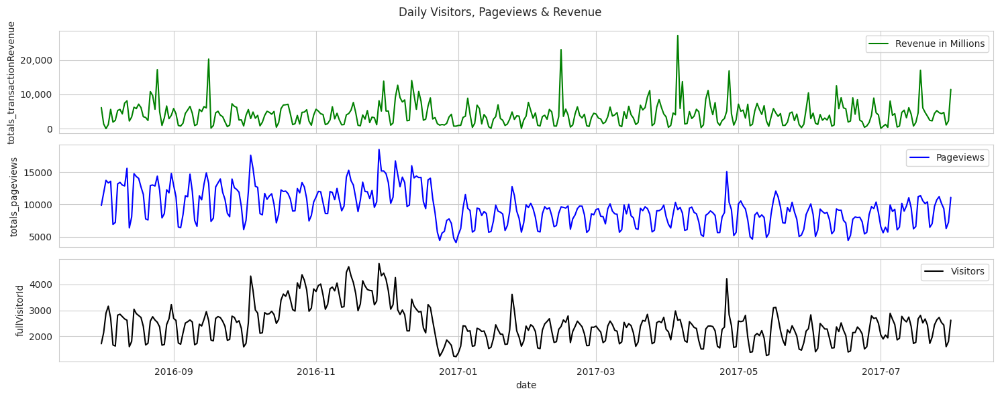

In [ ]:
fig, ax = plt.subplots(3, 1, figsize=(15, 6), sharex=True)

ticks_y = ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000000))

sns.lineplot(data=df_daily, x='date', y='totals_transactionRevenue', color='g', label='Revenue in Millions', ax=ax[0])
# plt.gca(ax=ax[0]).yaxis.set_major_formatter(ticks_y)
ax[0].yaxis.set_major_formatter(ticks_y)

# sns.lineplot(data=df_daily, x='date', y='totals.hits', color='b', label='Hits', ax=ax[1])
sns.lineplot(data=df_daily, x='date', y='totals_pageviews', color='b', label='Pageviews', ax=ax[1])

sns.lineplot(data=df_daily, x='date', y='fullVisitorId', color='k', label='Visitors', ax=ax[2])

plt.legend()
plt.suptitle('Daily Visitors, Pageviews & Revenue')
plt.tight_layout()
plt.show()

### 9.3 Weekly Anslysis

In [ ]:
df_week = df_train.groupby(['Weekday', 'Weekday_Num']).agg(aggregations)

df_week.sort_values(by='Weekday_Num', inplace=True)
df_week

,,fullVisitorId,totals_pageviews,totals_transactionRevenue
Weekday,Weekday_Num,,,
Mon,1,140905,"553,204","272,050,260,000"
Tue,2,144723,"562,203","299,161,300,000"
Wed,3,146733,"575,089","298,488,440,000"
Thu,4,142399,"555,366","269,170,560,000"
Fri,5,128331,"504,176","258,656,660,000"
Sat,6,97646,"349,311","58,397,360,000"
Sun,7,100360,"368,178","75,841,720,000"


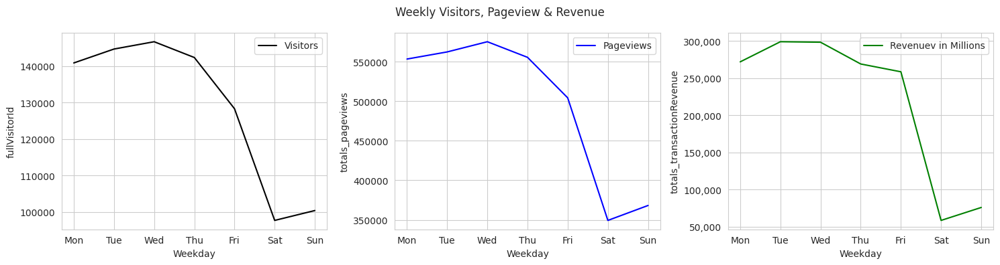

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), sharex=False)

sns.lineplot(data=df_week, x='Weekday', y='fullVisitorId', color='k', label='Visitors', ax=ax[0])
sns.lineplot(data=df_week, x='Weekday', y='totals_pageviews', color='b', label='Pageviews', ax=ax[1])

ticks_y = ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000000))
sns.lineplot(data=df_week, x='Weekday', y='totals_transactionRevenue', color='g', label='Revenuev in Millions', ax=ax[2])
ax[2].yaxis.set_major_formatter(ticks_y)

plt.legend()
plt.suptitle('Weekly Visitors, Pageview & Revenue')

plt.tight_layout()
plt.show()

### 9.4 Monthly Analysis

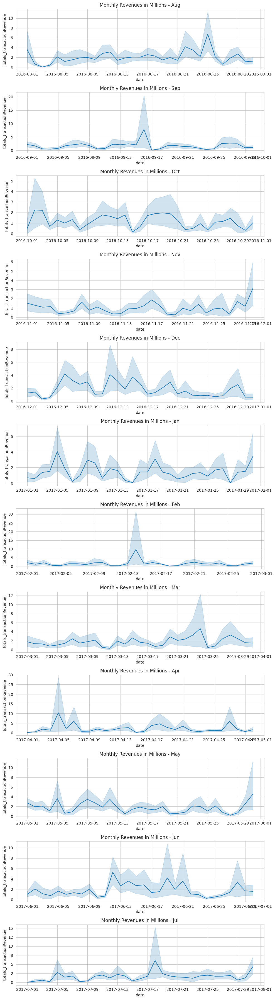

In [ ]:
df_train_dates = df_train.set_index(df_train['date']).drop('date', axis=1)

# months = df_train_dates['Month'].unique()
months = ['Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul']

# Set up subplots
fig, axes = plt.subplots(nrows=len(months), ncols=1,
                         figsize=(10, 3*len(months)))

# fig.suptitle('Monthly Revenues in Millions')

# Plot for each year
for i, month in enumerate(months):
    df_monthly = df_train_dates[df_train_dates['Month'] == month]
    df_monthly_rev = df_monthly['totals_transactionRevenue']

    # Set subplot title
    axes[i].set_title(f'Monthly Revenues in Millions - {month}')

    ticks_y = ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000000))

    # Plot on the i-th subplot
    # df_month_rev.plot(kind='line', ax=axes[i], rot=0)
    sns.lineplot(data=df_monthly_rev, ax=axes[i], legend=True)
    axes[i].yaxis.set_major_formatter(ticks_y)

    # Set y-axis scale
    # axes[i].set_yscale('log')

plt.tight_layout()
plt.show()

In [ ]:
df_month = df_train.groupby(['Year', 'Month', 'Month_Num']).agg(aggregations)
df_month = df_month[df_month.index != '2017-08-01']

df_month.sort_values(by=['Year', 'Month_Num'], inplace=True)
df_month = df_month.reset_index()

df_month

,Year,Month,Month_Num,fullVisitorId,totals_pageviews,totals_transactionRevenue
0,2016,Aug,8,74759,"362,365","154,666,560,000"
1,2016,Sep,9,71032,"327,363","126,031,240,000"
2,2016,Oct,10,97506,"336,666","113,329,070,000"
3,2016,Nov,11,113972,"355,328","119,013,870,000"
4,2016,Dec,12,79124,"333,785","154,557,930,000"
5,2017,Jan,1,64694,"257,708","97,877,790,000"
6,2017,Feb,2,62192,"233,373","108,756,520,000"
7,2017,Mar,3,69931,"259,522","130,964,270,000"
8,2017,Apr,4,67126,"242,576","158,788,800,000"
9,2017,May,5,65371,"255,077","121,711,480,000"


## 10. Machine Learning Model

In [ ]:
import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error

### 10.1 Data Transformation

In [ ]:
### Create calendar columns in test dataset
df_test = df_test.copy()

create_features(df_test)
df_test.tail()

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,...,totals_bounces,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType,Year,Month,Month_Num,Day,Weekday,Weekday_Num
804679,Social,2018-04-21,9084225574121020383,9084225574121020383_1524358436,2,Edge,Windows,False,desktop,United States,...,0,youtube.com,referral,others,2018,Apr,4,21,Sat,6
804680,Social,2018-04-21,6146210385566305056,6146210385566305056_1524317728,1,Chrome,Android,True,mobile,Uruguay,...,0,youtube.com,referral,others,2018,Apr,4,21,Sat,6
804681,Social,2018-04-21,7484543584006767361,7484543584006767361_1524364725,1,Safari (in-app),iOS,True,mobile,Canada,...,0,m.facebook.com,referral,others,2018,Apr,4,21,Sat,6
804682,Social,2018-04-21,2915966035609674201,2915966035609674201_1524330416,1,Samsung Internet,Android,True,mobile,Ireland,...,0,youtube.com,referral,others,2018,Apr,4,21,Sat,6
804683,Social,2018-04-21,5334918847827785763,5334918847827785763_1524301572,1,MRCHROME,Windows,False,desktop,Russia,...,0,youtube.com,referral,others,2018,Apr,4,21,Sat,6


In [ ]:
train_set = df_train.drop(columns=['Year', 'Month', 'Weekday'], axis=1).reset_index(drop=True)
test_set = df_test.drop(columns=['Year', 'Month', 'Weekday'], axis=1).reset_index(drop=True)

print(train_set.shape, test_set.shape)

(901097, 21) (804684, 20)


In [ ]:
# numeric_columns = train_set.select_dtypes(include='number').columns
numeric_cols = [c for c in train_set.columns if c.startswith('total') and c != 'totals_transactionRevenue']
numeric_cols

['totals_hits', 'totals_pageviews', 'totals_bounces']

In [ ]:
for col in numeric_cols:

    # Check for and handle missing values
    train_set[col].fillna(0, inplace=True)
    test_set[col].fillna(0, inplace=True)

    sc = StandardScaler()
    # Fit the StandardScaler on the combined data (train and test)
    sc.fit(pd.concat([train_set[[col]], test_set[[col]]], axis=0, ignore_index=True))

    # Transform the values in both train and test sets
    train_set[col] = sc.transform(train_set[[col]])
    test_set[col] = sc.transform(test_set[[col]])

In [ ]:
# categorical_columns = train_set.select_dtypes(include='object').columns

## exclude columns for normalization or label-encoding
cols_excluded = ['date', 'visitNumber']

categorical_cols = [c for c in train_set.columns if c not in cols_excluded and not c.startswith('total')]
categorical_cols

['channelGrouping',
 'fullVisitorId',
 'sessionId',
 'device_browser',
 'device_operatingSystem',
 'device_isMobile',
 'device_deviceCategory',
 'geoNetwork_country',
 'geoNetwork_region',
 'trafficSource_source',
 'trafficSource_medium',
 'trafficSource_adwordsClickInfo.adNetworkType',
 'Month_Num',
 'Day',
 'Weekday_Num']

In [ ]:
# Convert date to UNIX timestamp
train_set['date'] = train['date'].astype(int)
test_set['date'] = test['date'].astype(int)

In [ ]:
for col in categorical_cols:

    le = LabelEncoder()
    # Fit the LabelEncoder on the combined data (train and test)
    le.fit(pd.concat([train_set[col], test_set[col]], axis=0, ignore_index=True))

    # Transform the values in both train and test sets
    train_set[col] = le.transform(train_set[col])
    test_set[col] = le.transform(test_set[col])

In [ ]:
X = train_set.drop('totals_transactionRevenue', axis=1)
y = train_set['totals_transactionRevenue']

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.20, random_state=42)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(720877, 20) (180220, 20) (720877,) (180220,)


In [ ]:
params = {'num_leaves': 38,
          'min_data_in_leaf': 50,
          'objective': 'regression',
          'max_depth': -1,
          'learning_rate': 0.1,
          'verbose': -1,
          'predict_disable_shape_check': [True]
          }

train_data = lgb.Dataset(X_train, y_train)
test_data = lgb.Dataset(X_test, y_test)

model = lgb.train(params,
                train_data,
                20000,
                valid_sets=[train_data, test_data],
                callbacks=[lgb.early_stopping(stopping_rounds=500), lgb.log_evaluation(50)])

Training until validation scores don't improve for 500 rounds
[50]	training's l2: 2.43051e+15	valid_1's l2: 1.72341e+15
[100]	training's l2: 2.25679e+15	valid_1's l2: 1.75982e+15
[150]	training's l2: 2.12103e+15	valid_1's l2: 1.79185e+15
[200]	training's l2: 1.98936e+15	valid_1's l2: 1.83527e+15
[250]	training's l2: 1.87233e+15	valid_1's l2: 1.87245e+15
[300]	training's l2: 1.76957e+15	valid_1's l2: 1.91751e+15
[350]	training's l2: 1.67346e+15	valid_1's l2: 1.95186e+15
[400]	training's l2: 1.59146e+15	valid_1's l2: 1.99306e+15
[450]	training's l2: 1.5172e+15	valid_1's l2: 2.02774e+15
[500]	training's l2: 1.45103e+15	valid_1's l2: 2.05235e+15
Early stopping, best iteration is:
[6]	training's l2: 2.82357e+15	valid_1's l2: 1.68287e+15


In [ ]:
preds = model.predict(test_set, num_iteration=model.best_iteration)
preds

array([ 951011,  951011,  951011, ...,  3711498,  3711498,  3711498])

In [ ]:
test_set["PredictedRevenue"] = preds
test_set

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,...,totals_hits,totals_pageviews,totals_bounces,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType,Month_Num,Day,Weekday_Num,PredictedRevenue
0,4,20171016,815267,1050777,2,34,6,0,0,176,...,-0,0,-1,207,4,3,9,15,0,"951,011"
1,4,20171016,84748,108973,1,34,19,0,0,185,...,0,0,-1,207,4,3,9,15,0,"951,011"
2,4,20171016,800824,1032508,1,34,6,0,0,69,...,0,1,-1,207,4,3,9,15,0,"951,011"
3,4,20171016,313661,403996,1,71,22,1,1,218,...,0,0,-1,207,4,3,9,15,0,"951,011"
4,4,20171016,305461,393467,1,71,6,0,0,218,...,1,0,-1,207,4,3,9,15,0,"951,011"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804679,7,20180421,1201214,1548955,2,41,19,0,0,218,...,3,3,-1,497,6,3,3,20,5,"14,944,273"
804680,7,20180421,812386,1047132,1,34,0,1,1,219,...,4,5,-1,497,6,3,3,20,5,"13,203,293"
804681,7,20180421,989404,1276145,1,72,22,1,1,36,...,5,5,-1,338,6,3,3,20,5,"3,711,498"
804682,7,20180421,385405,496089,1,73,0,1,1,97,...,6,5,-1,497,6,3,3,20,5,"3,711,498"


In [ ]:
lgb_params = {'objective': 'regression',
              'metric': 'rmse',
              'num_leaves': 50,
              'learning_rate': 0.01,
              'bagging_fraction': 0.75,
              'feature_fraction': 0.8,
              'bagging_frequency': 5,
              'force_row_wise': True,
              'verbose': -1,
              'predict_disable_shape_check': True
}

lgb_train = lgb.Dataset(X_train, label=y_train)
lgb_val = lgb.Dataset(X_test, label=y_test)
model_1 = lgb.train(lgb_params, lgb_train,
                  num_boost_round=700,
                  valid_sets=[lgb_val],
                  callbacks=[lgb.early_stopping(stopping_rounds=500),
                             lgb.log_evaluation(50), ])

Training until validation scores don't improve for 500 rounds
[50]	valid_0's rmse: 4.11083e+07
[100]	valid_0's rmse: 4.10587e+07
[150]	valid_0's rmse: 4.11826e+07
[200]	valid_0's rmse: 4.14502e+07
[250]	valid_0's rmse: 4.13059e+07
[300]	valid_0's rmse: 4.12115e+07
[350]	valid_0's rmse: 4.12372e+07
[400]	valid_0's rmse: 4.13144e+07
[450]	valid_0's rmse: 4.1393e+07
[500]	valid_0's rmse: 4.14546e+07
[550]	valid_0's rmse: 4.15178e+07
Early stopping, best iteration is:
[67]	valid_0's rmse: 4.10137e+07


In [ ]:
preds_1 = model_1.predict(test_set.loc[:, test_set.columns != 'PredictedRevenue'],
                          num_iteration=model.best_iteration, )
preds_1

array([ 1620417,  1620417,  1620417, ...,  2426558,  2675770,  2675770])

In [ ]:
test_set["PredictedRevenue"] = preds_1
test_set

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,...,totals_hits,totals_pageviews,totals_bounces,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType,Month_Num,Day,Weekday_Num,PredictedRevenue
0,4,20171016,815267,1050777,2,34,6,0,0,176,...,-0,0,-1,207,4,3,9,15,0,"1,620,417"
1,4,20171016,84748,108973,1,34,19,0,0,185,...,0,0,-1,207,4,3,9,15,0,"1,620,417"
2,4,20171016,800824,1032508,1,34,6,0,0,69,...,0,1,-1,207,4,3,9,15,0,"1,620,417"
3,4,20171016,313661,403996,1,71,22,1,1,218,...,0,0,-1,207,4,3,9,15,0,"1,620,417"
4,4,20171016,305461,393467,1,71,6,0,0,218,...,1,0,-1,207,4,3,9,15,0,"1,620,417"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804679,7,20180421,1201214,1548955,2,41,19,0,0,218,...,3,3,-1,497,6,3,3,20,5,"2,937,328"
804680,7,20180421,812386,1047132,1,34,0,1,1,219,...,4,5,-1,497,6,3,3,20,5,"8,644,856"
804681,7,20180421,989404,1276145,1,72,22,1,1,36,...,5,5,-1,338,6,3,3,20,5,"2,426,558"
804682,7,20180421,385405,496089,1,73,0,1,1,97,...,6,5,-1,497,6,3,3,20,5,"2,675,770"


In [ ]:
from lightgbm import LGBMRegressor

In [ ]:
lgb_params = {'num_leaves' : 50, 'learning_rate' : 0.01,
              'bagging_fraction' : 0.75, 'feature_fraction' : 0.8,
              'bagging_frequency' : 5, 'force_row_wise': [True],
              'verbose': -1,}

model_2 = LGBMRegressor(**lgb_params, n_estimators=700)
model_2.fit(X_train, y_train,
          eval_set=[(X_test, y_test)])

LGBMRegressor(bagging_fraction=0.75, bagging_frequency=5, feature_fraction=0.8,
              force_row_wise=[True], learning_rate=0.01, n_estimators=700,
              num_leaves=50, verbose=-1)

In [ ]:
preds_2 = model_2.predict(test_set.loc[:, test_set.columns != 'PredictedRevenue'],
                          num_iteration=model.best_iteration, )
preds_2

array([ 1620417,  1620417,  1620417, ...,  2426558,  2675770,  2675770])

In [ ]:
test_set["PredictedRevenue"] = preds_2
test_set

,channelGrouping,date,fullVisitorId,sessionId,visitNumber,device_browser,device_operatingSystem,device_isMobile,device_deviceCategory,geoNetwork_country,...,totals_hits,totals_pageviews,totals_bounces,trafficSource_source,trafficSource_medium,trafficSource_adwordsClickInfo.adNetworkType,Month_Num,Day,Weekday_Num,PredictedRevenue
0,4,20171016,815267,1050777,2,34,6,0,0,176,...,-0,0,-1,207,4,3,9,15,0,"1,620,417"
1,4,20171016,84748,108973,1,34,19,0,0,185,...,0,0,-1,207,4,3,9,15,0,"1,620,417"
2,4,20171016,800824,1032508,1,34,6,0,0,69,...,0,1,-1,207,4,3,9,15,0,"1,620,417"
3,4,20171016,313661,403996,1,71,22,1,1,218,...,0,0,-1,207,4,3,9,15,0,"1,620,417"
4,4,20171016,305461,393467,1,71,6,0,0,218,...,1,0,-1,207,4,3,9,15,0,"1,620,417"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804679,7,20180421,1201214,1548955,2,41,19,0,0,218,...,3,3,-1,497,6,3,3,20,5,"2,937,328"
804680,7,20180421,812386,1047132,1,34,0,1,1,219,...,4,5,-1,497,6,3,3,20,5,"8,644,856"
804681,7,20180421,989404,1276145,1,72,22,1,1,36,...,5,5,-1,338,6,3,3,20,5,"2,426,558"
804682,7,20180421,385405,496089,1,73,0,1,1,97,...,6,5,-1,497,6,3,3,20,5,"2,675,770"


In [ ]:
import joblib
# Save the trained model to a file
joblib.dump(model_2, 'model.pkl')


['model.pkl']